# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

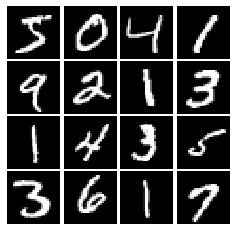

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(x, alpha * x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform([batch_size, dim], minval=-1, maxval=1, seed=1234)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(256, input_shape=(784,), activation=leaky_relu),
        tf.keras.layers.Dense(256, activation=leaky_relu),
        tf.keras.layers.Dense(1),
        

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [39]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(1024, input_shape=(noise_dim,), activation='relu'),
        tf.keras.layers.Dense(1024, activation='relu'),
        tf.keras.layers.Dense(784, activation='tanh'),
        

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [40]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [16]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    ones = tf.ones(logits_real.shape)
    zeros = tf.zeros(logits_fake.shape)
    
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    real_loss = bce(ones, logits_real)
    fake_loss = bce(zeros, logits_fake)
    
    loss = real_loss + fake_loss

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    ones = tf.ones(logits_fake.shape) # for fake to looks like real
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    fake_loss = bce(ones, logits_fake)
    
    loss = fake_loss
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [17]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [18]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [19]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [20]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 2.113, G:0.7532
Instructions for updating:
Use tf.identity instead.


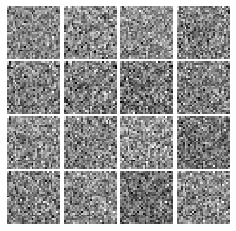

Epoch: 0, Iter: 20, D: 0.5981, G:0.9077


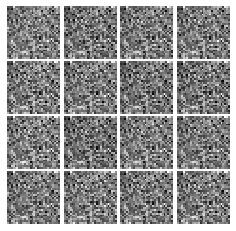

Epoch: 0, Iter: 40, D: 0.5071, G:0.9823


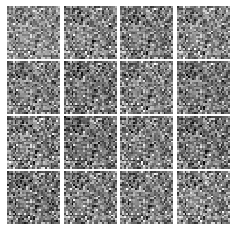

Epoch: 0, Iter: 60, D: 0.2673, G:2.6


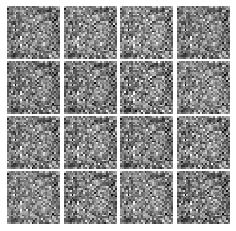

Epoch: 0, Iter: 80, D: 1.345, G:1.475


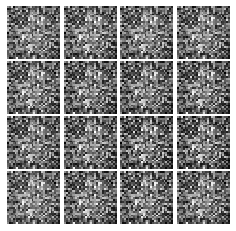

Epoch: 0, Iter: 100, D: 0.8292, G:1.917


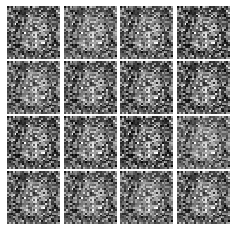

Epoch: 0, Iter: 120, D: 1.141, G:1.57


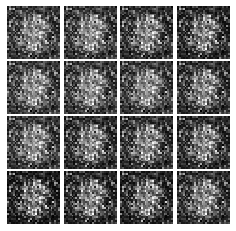

Epoch: 0, Iter: 140, D: 1.622, G:1.113


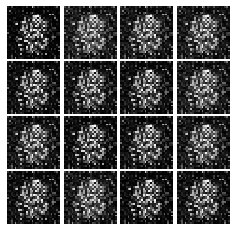

Epoch: 0, Iter: 160, D: 2.157, G:1.376


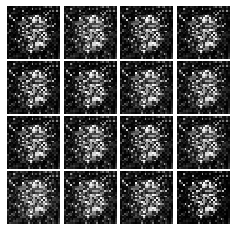

Epoch: 0, Iter: 180, D: 0.9017, G:2.203


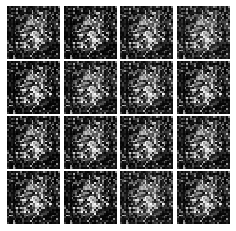

Epoch: 0, Iter: 200, D: 2.109, G:1.195


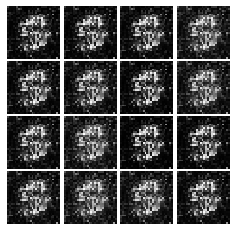

Epoch: 0, Iter: 220, D: 1.596, G:0.6794


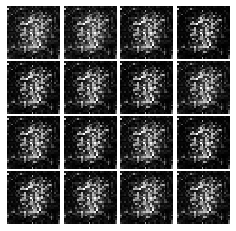

Epoch: 0, Iter: 240, D: 1.547, G:1.432


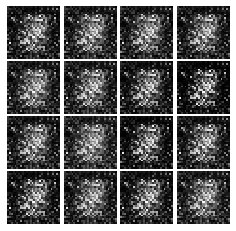

Epoch: 0, Iter: 260, D: 1.892, G:0.928


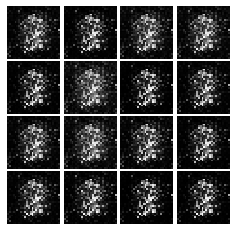

Epoch: 0, Iter: 280, D: 1.091, G:1.218


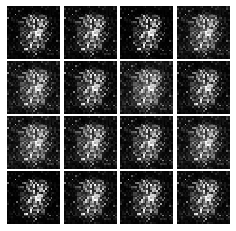

Epoch: 0, Iter: 300, D: 1.628, G:0.7868


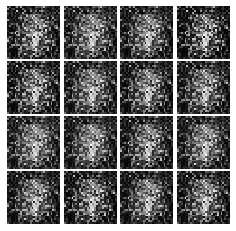

Epoch: 0, Iter: 320, D: 1.13, G:1.257


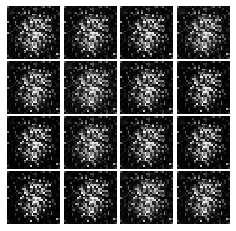

Epoch: 0, Iter: 340, D: 1.097, G:1.21


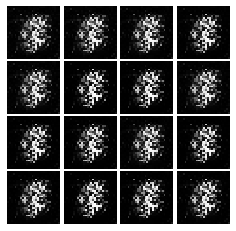

Epoch: 0, Iter: 360, D: 1.322, G:1.223


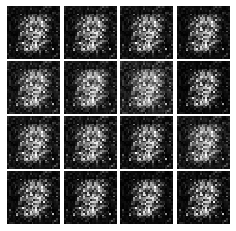

Epoch: 0, Iter: 380, D: 1.135, G:1.389


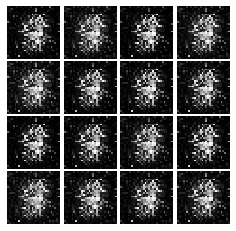

Epoch: 0, Iter: 400, D: 1.295, G:1.468


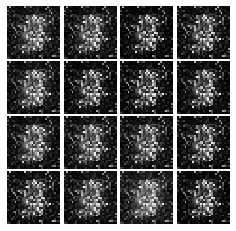

Epoch: 0, Iter: 420, D: 1.033, G:1.219


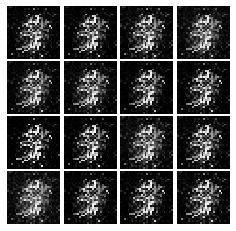

Epoch: 0, Iter: 440, D: 1.198, G:1.238


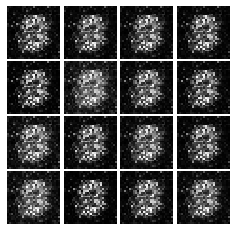

Epoch: 0, Iter: 460, D: 1.025, G:0.8151


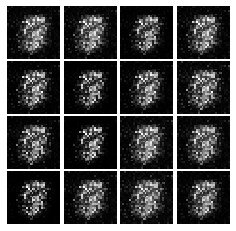

Epoch: 1, Iter: 480, D: 1.102, G:1.243


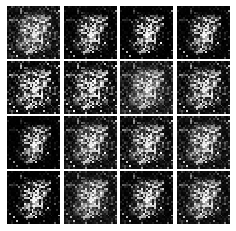

Epoch: 1, Iter: 500, D: 1.731, G:1.014


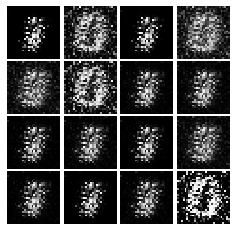

Epoch: 1, Iter: 520, D: 0.9835, G:1.239


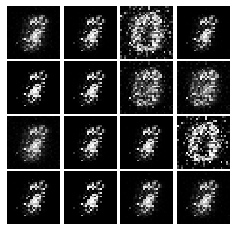

Epoch: 1, Iter: 540, D: 1.142, G:1.89


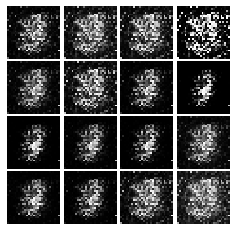

Epoch: 1, Iter: 560, D: 1.004, G:1.276


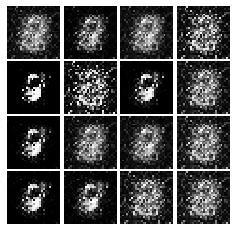

Epoch: 1, Iter: 580, D: 1.296, G:1.084


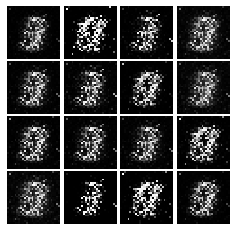

Epoch: 1, Iter: 600, D: 1.186, G:1.688


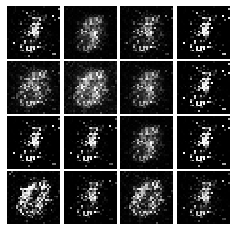

Epoch: 1, Iter: 620, D: 1.321, G:1.426


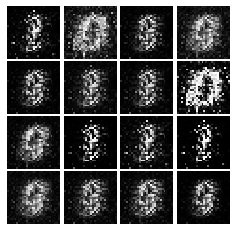

Epoch: 1, Iter: 640, D: 1.129, G:1.718


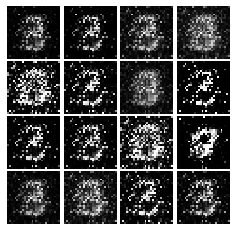

Epoch: 1, Iter: 660, D: 0.9512, G:1.417


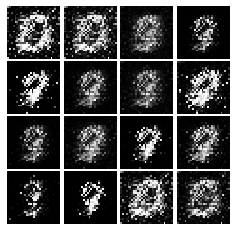

Epoch: 1, Iter: 680, D: 1.088, G:0.645


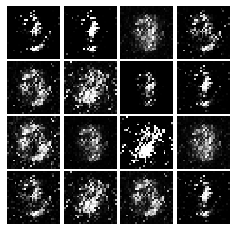

Epoch: 1, Iter: 700, D: 1.346, G:0.6151


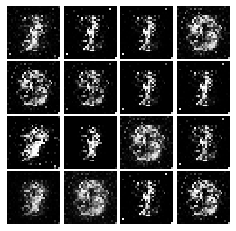

Epoch: 1, Iter: 720, D: 1.566, G:0.7698


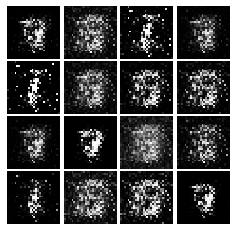

Epoch: 1, Iter: 740, D: 1.136, G:1.103


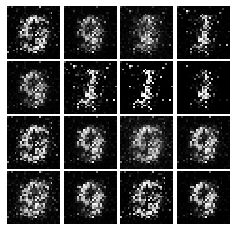

Epoch: 1, Iter: 760, D: 1.068, G:1.432


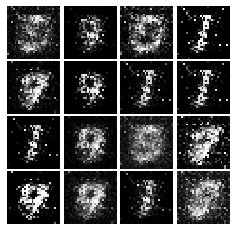

Epoch: 1, Iter: 780, D: 1.522, G:0.8848


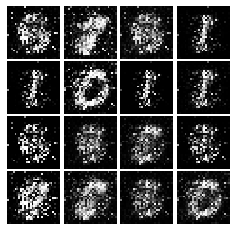

Epoch: 1, Iter: 800, D: 1.424, G:1.122


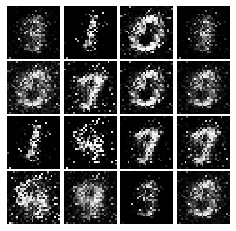

Epoch: 1, Iter: 820, D: 1.168, G:1.209


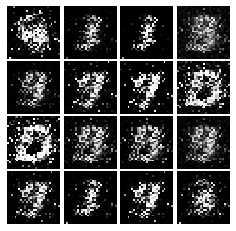

Epoch: 1, Iter: 840, D: 1.154, G:0.8113


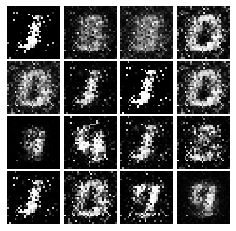

Epoch: 1, Iter: 860, D: 1.13, G:1.165


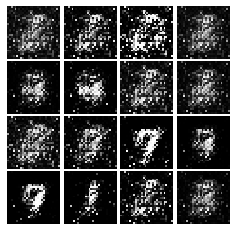

Epoch: 1, Iter: 880, D: 1.274, G:1.245


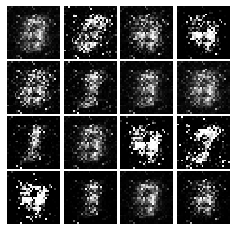

Epoch: 1, Iter: 900, D: 1.026, G:1.254


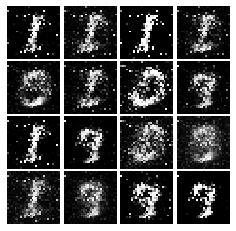

Epoch: 1, Iter: 920, D: 1.55, G:0.7922


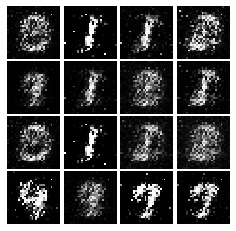

Epoch: 2, Iter: 940, D: 1.12, G:1.277


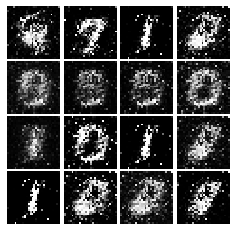

Epoch: 2, Iter: 960, D: 1.251, G:1.317


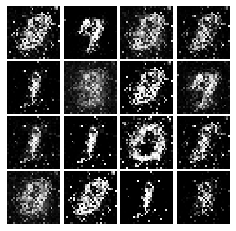

Epoch: 2, Iter: 980, D: 1.243, G:1.003


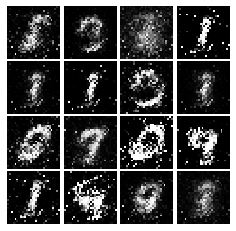

Epoch: 2, Iter: 1000, D: 1.181, G:1.168


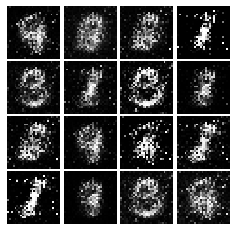

Epoch: 2, Iter: 1020, D: 1.441, G:0.9016


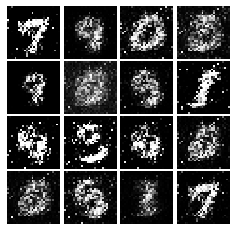

Epoch: 2, Iter: 1040, D: 1.343, G:0.9984


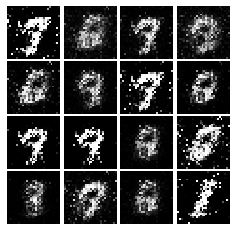

Epoch: 2, Iter: 1060, D: 1.366, G:0.3477


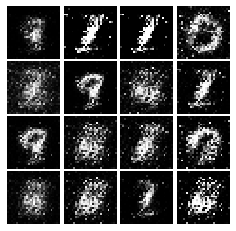

Epoch: 2, Iter: 1080, D: 1.365, G:0.9947


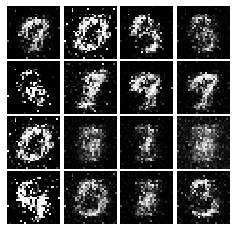

Epoch: 2, Iter: 1100, D: 1.037, G:1.261


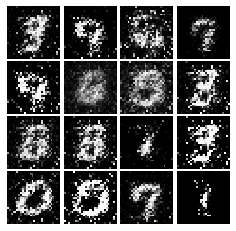

Epoch: 2, Iter: 1120, D: 1.371, G:0.9324


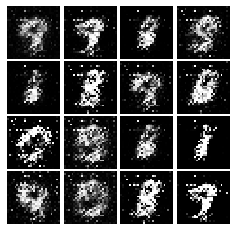

Epoch: 2, Iter: 1140, D: 1.251, G:1.02


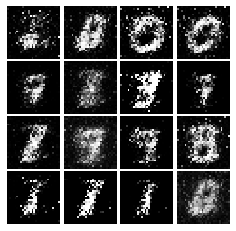

Epoch: 2, Iter: 1160, D: 1.317, G:0.9316


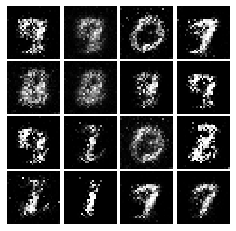

Epoch: 2, Iter: 1180, D: 1.327, G:0.9042


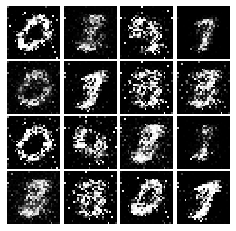

Epoch: 2, Iter: 1200, D: 1.296, G:0.7629


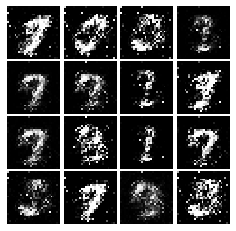

Epoch: 2, Iter: 1220, D: 1.209, G:1.034


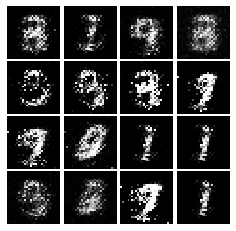

Epoch: 2, Iter: 1240, D: 1.34, G:0.9315


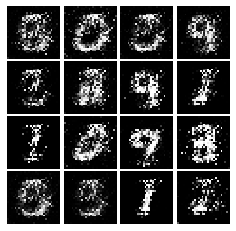

Epoch: 2, Iter: 1260, D: 1.283, G:0.9023


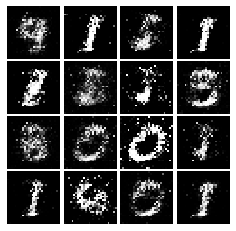

Epoch: 2, Iter: 1280, D: 1.233, G:1.093


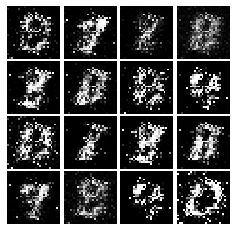

Epoch: 2, Iter: 1300, D: 2.194, G:0.506


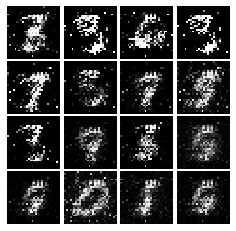

Epoch: 2, Iter: 1320, D: 1.575, G:0.6484


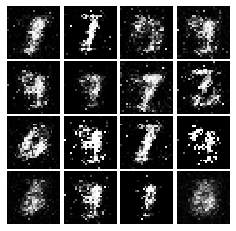

Epoch: 2, Iter: 1340, D: 1.243, G:0.9852


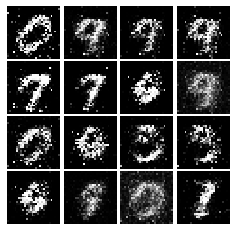

Epoch: 2, Iter: 1360, D: 1.092, G:1.059


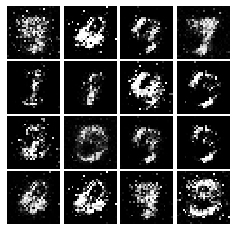

Epoch: 2, Iter: 1380, D: 1.136, G:1.471


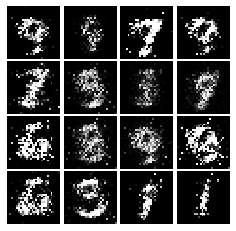

Epoch: 2, Iter: 1400, D: 1.199, G:0.7901


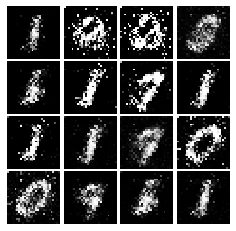

Epoch: 3, Iter: 1420, D: 1.35, G:0.8126


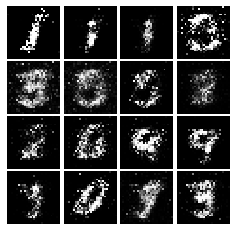

Epoch: 3, Iter: 1440, D: 1.141, G:0.852


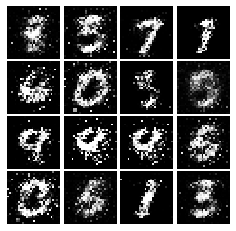

Epoch: 3, Iter: 1460, D: 1.118, G:0.8159


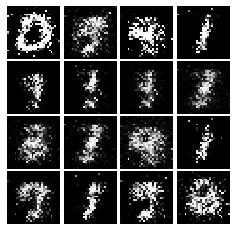

Epoch: 3, Iter: 1480, D: 1.214, G:1.031


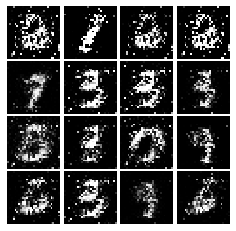

Epoch: 3, Iter: 1500, D: 1.267, G:0.8644


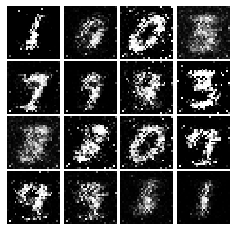

Epoch: 3, Iter: 1520, D: 1.202, G:0.9613


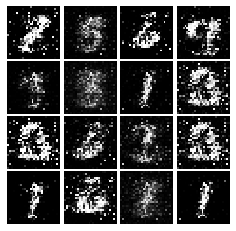

Epoch: 3, Iter: 1540, D: 1.404, G:2.544


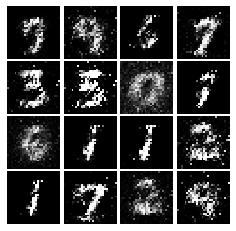

Epoch: 3, Iter: 1560, D: 1.593, G:0.7025


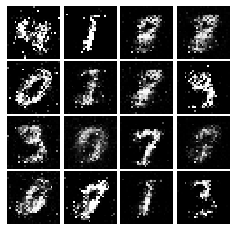

Epoch: 3, Iter: 1580, D: 1.269, G:0.9007


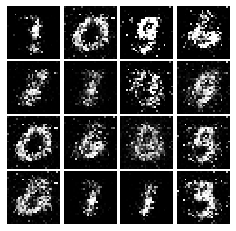

Epoch: 3, Iter: 1600, D: 1.234, G:0.9763


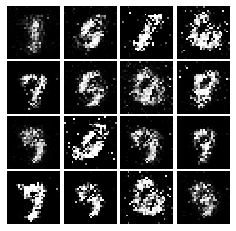

Epoch: 3, Iter: 1620, D: 1.017, G:2.218


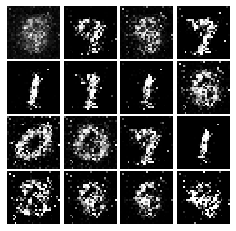

Epoch: 3, Iter: 1640, D: 1.25, G:1.064


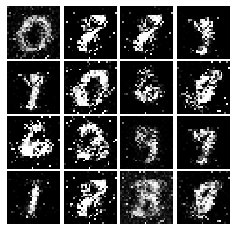

Epoch: 3, Iter: 1660, D: 1.028, G:1.146


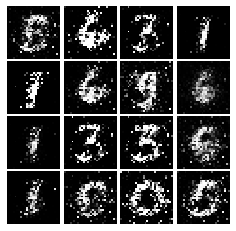

Epoch: 3, Iter: 1680, D: 1.34, G:0.9545


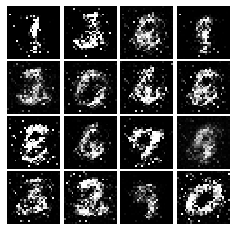

Epoch: 3, Iter: 1700, D: 1.264, G:1.054


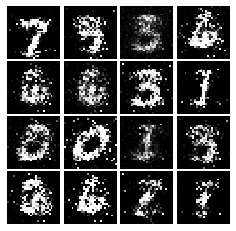

Epoch: 3, Iter: 1720, D: 1.171, G:1.03


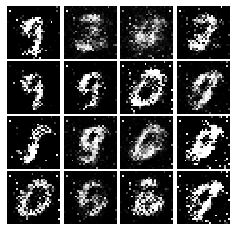

Epoch: 3, Iter: 1740, D: 1.322, G:1.168


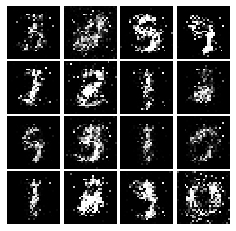

Epoch: 3, Iter: 1760, D: 1.315, G:1.305


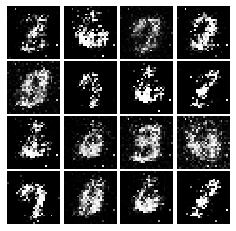

Epoch: 3, Iter: 1780, D: 1.283, G:1.03


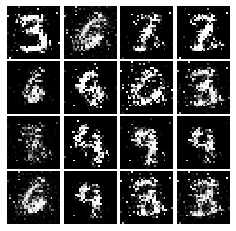

Epoch: 3, Iter: 1800, D: 1.726, G:2.207


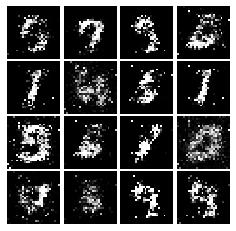

Epoch: 3, Iter: 1820, D: 1.246, G:1.108


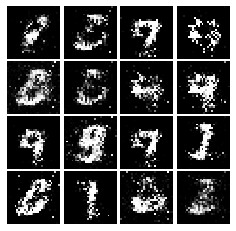

Epoch: 3, Iter: 1840, D: 1.236, G:2.399


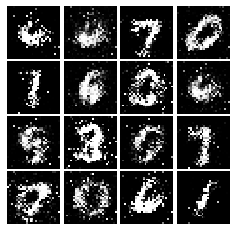

Epoch: 3, Iter: 1860, D: 1.378, G:0.8373


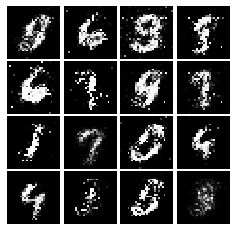

Epoch: 4, Iter: 1880, D: 1.273, G:0.9364


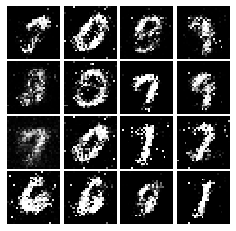

Epoch: 4, Iter: 1900, D: 1.292, G:0.9847


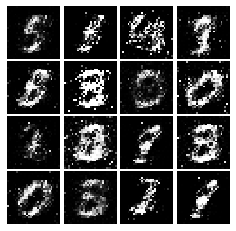

Epoch: 4, Iter: 1920, D: 1.231, G:0.8549


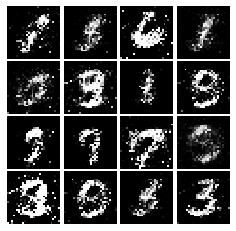

Epoch: 4, Iter: 1940, D: 1.178, G:1.023


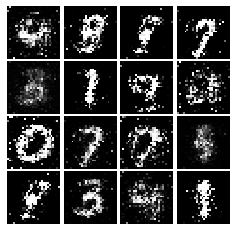

Epoch: 4, Iter: 1960, D: 1.359, G:0.9372


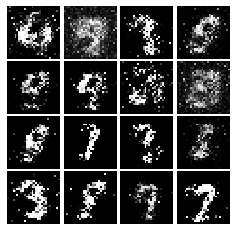

Epoch: 4, Iter: 1980, D: 1.175, G:0.8396


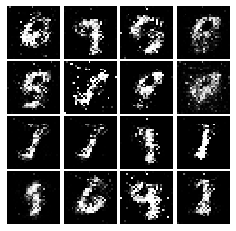

Epoch: 4, Iter: 2000, D: 1.296, G:0.8625


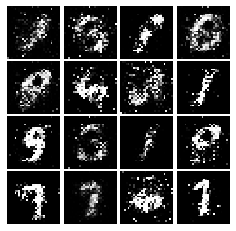

Epoch: 4, Iter: 2020, D: 1.329, G:0.8947


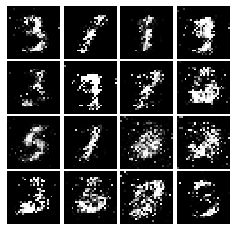

Epoch: 4, Iter: 2040, D: 1.358, G:1.078


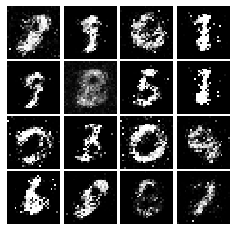

Epoch: 4, Iter: 2060, D: 1.472, G:0.9407


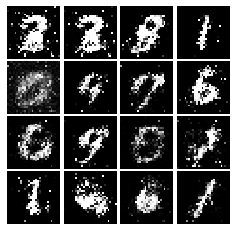

Epoch: 4, Iter: 2080, D: 1.286, G:1.151


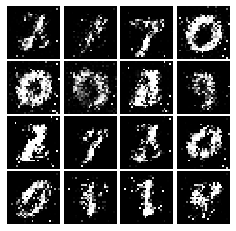

Epoch: 4, Iter: 2100, D: 1.226, G:0.9267


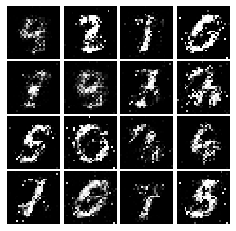

Epoch: 4, Iter: 2120, D: 1.295, G:0.857


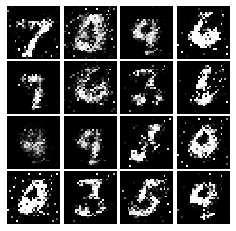

Epoch: 4, Iter: 2140, D: 1.316, G:0.9983


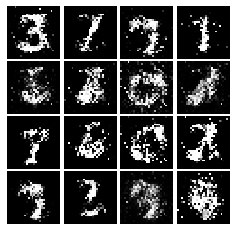

Epoch: 4, Iter: 2160, D: 1.338, G:0.947


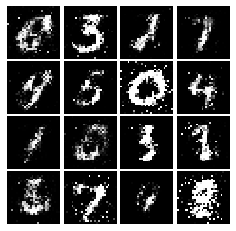

Epoch: 4, Iter: 2180, D: 1.229, G:0.8696


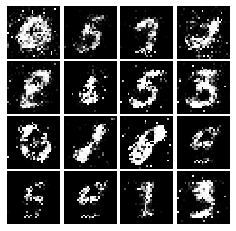

Epoch: 4, Iter: 2200, D: 1.216, G:1.085


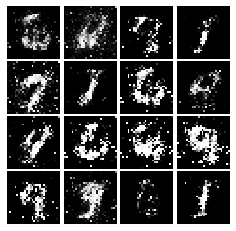

Epoch: 4, Iter: 2220, D: 1.143, G:1.202


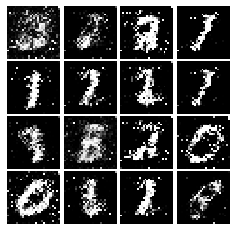

Epoch: 4, Iter: 2240, D: 1.251, G:1.023


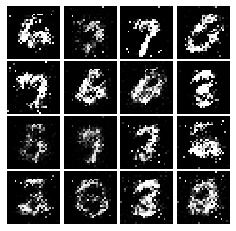

Epoch: 4, Iter: 2260, D: 1.427, G:1.136


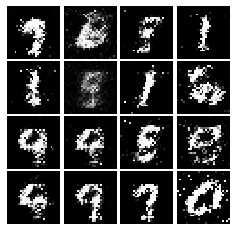

Epoch: 4, Iter: 2280, D: 1.235, G:0.938


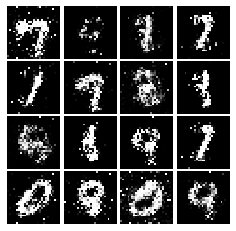

Epoch: 4, Iter: 2300, D: 1.266, G:0.9956


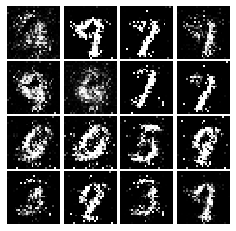

Epoch: 4, Iter: 2320, D: 1.205, G:0.9323


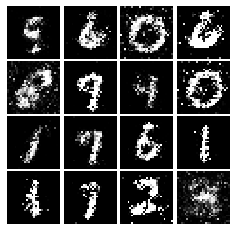

Epoch: 4, Iter: 2340, D: 1.277, G:0.8483


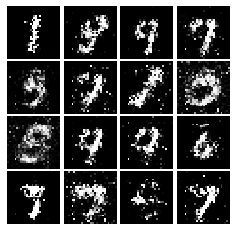

Epoch: 5, Iter: 2360, D: 1.148, G:0.9652


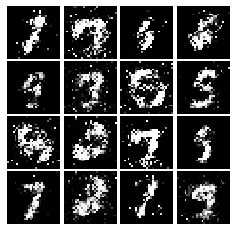

Epoch: 5, Iter: 2380, D: 1.209, G:0.9591


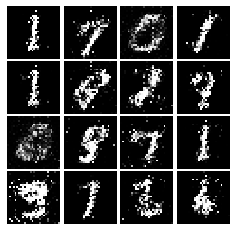

Epoch: 5, Iter: 2400, D: 1.326, G:0.9028


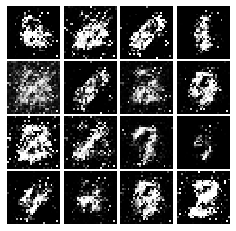

Epoch: 5, Iter: 2420, D: 1.177, G:0.9326


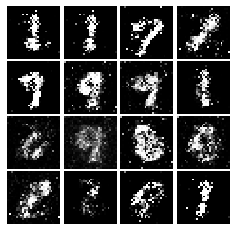

Epoch: 5, Iter: 2440, D: 1.346, G:0.8733


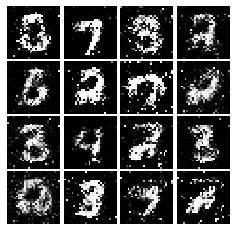

Epoch: 5, Iter: 2460, D: 1.224, G:0.9827


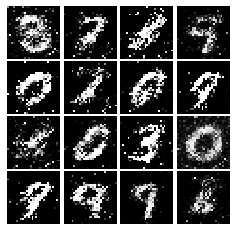

Epoch: 5, Iter: 2480, D: 1.324, G:0.912


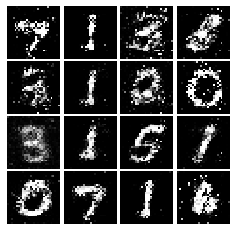

Epoch: 5, Iter: 2500, D: 1.223, G:0.8061


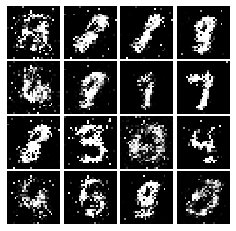

Epoch: 5, Iter: 2520, D: 1.338, G:0.8139


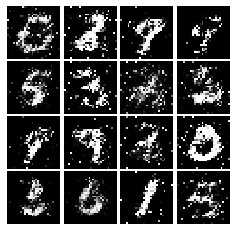

Epoch: 5, Iter: 2540, D: 1.284, G:0.8901


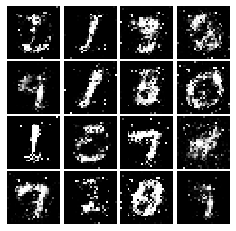

Epoch: 5, Iter: 2560, D: 1.314, G:1.103


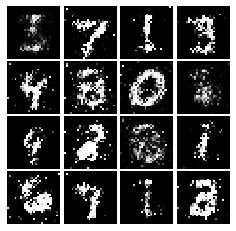

Epoch: 5, Iter: 2580, D: 1.332, G:1.063


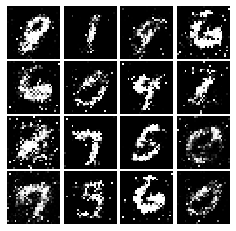

Epoch: 5, Iter: 2600, D: 1.505, G:0.8594


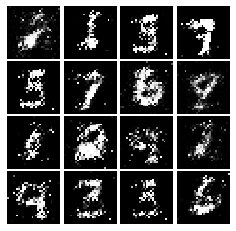

Epoch: 5, Iter: 2620, D: 1.263, G:0.8768


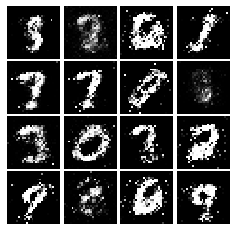

Epoch: 5, Iter: 2640, D: 1.298, G:0.9634


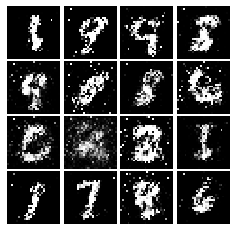

Epoch: 5, Iter: 2660, D: 1.322, G:0.7832


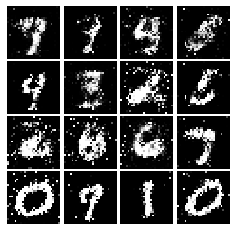

Epoch: 5, Iter: 2680, D: 1.352, G:0.8509


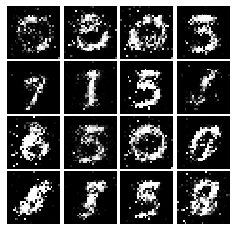

Epoch: 5, Iter: 2700, D: 1.411, G:0.8052


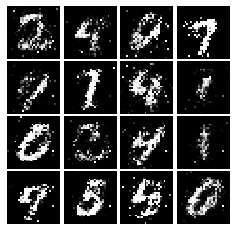

Epoch: 5, Iter: 2720, D: 1.271, G:0.8078


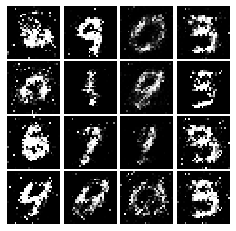

Epoch: 5, Iter: 2740, D: 1.288, G:0.8431


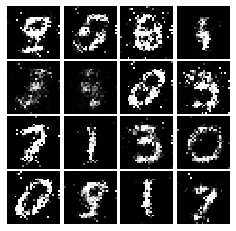

Epoch: 5, Iter: 2760, D: 1.356, G:0.8779


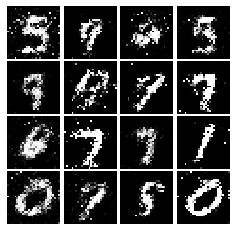

Epoch: 5, Iter: 2780, D: 1.384, G:0.7159


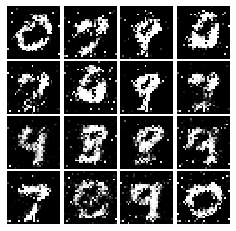

Epoch: 5, Iter: 2800, D: 1.193, G:1.153


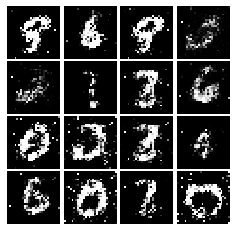

Epoch: 6, Iter: 2820, D: 1.345, G:0.7301


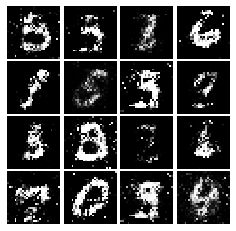

Epoch: 6, Iter: 2840, D: 1.316, G:0.8501


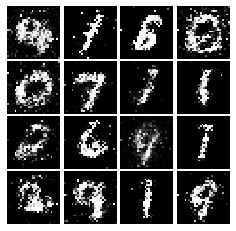

Epoch: 6, Iter: 2860, D: 1.331, G:0.7806


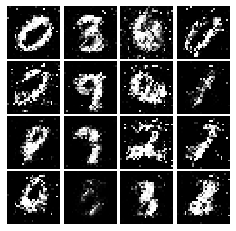

Epoch: 6, Iter: 2880, D: 1.35, G:0.89


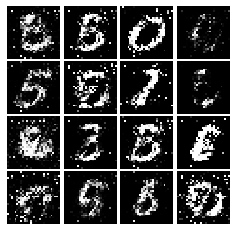

Epoch: 6, Iter: 2900, D: 1.319, G:0.8113


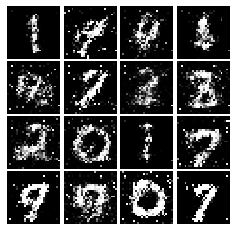

Epoch: 6, Iter: 2920, D: 1.453, G:0.802


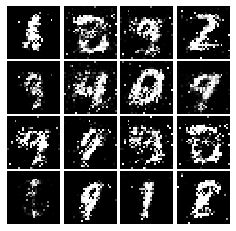

Epoch: 6, Iter: 2940, D: 1.326, G:0.7728


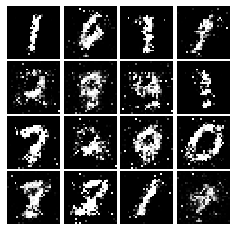

Epoch: 6, Iter: 2960, D: 1.356, G:0.7284


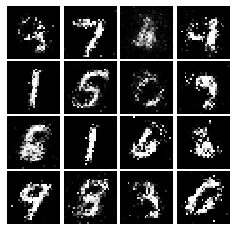

Epoch: 6, Iter: 2980, D: 1.391, G:0.7328


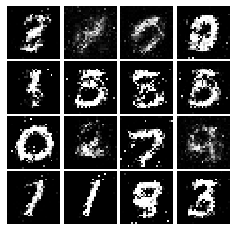

Epoch: 6, Iter: 3000, D: 1.353, G:0.8057


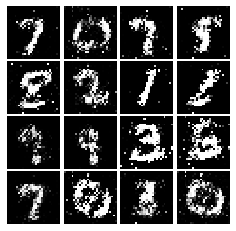

Epoch: 6, Iter: 3020, D: 1.368, G:0.8918


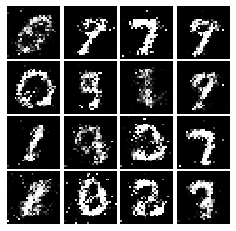

Epoch: 6, Iter: 3040, D: 1.393, G:0.7568


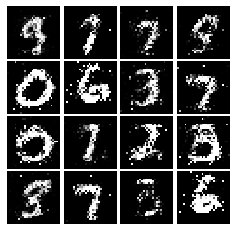

Epoch: 6, Iter: 3060, D: 1.279, G:0.8732


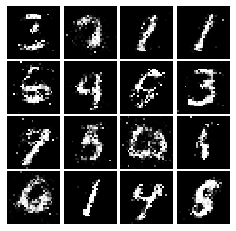

Epoch: 6, Iter: 3080, D: 1.317, G:0.7802


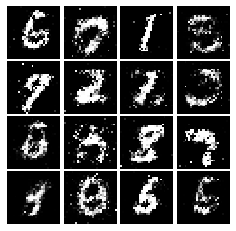

Epoch: 6, Iter: 3100, D: 1.346, G:0.745


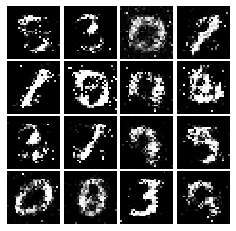

Epoch: 6, Iter: 3120, D: 1.382, G:0.7553


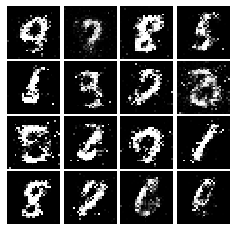

Epoch: 6, Iter: 3140, D: 1.332, G:0.9611


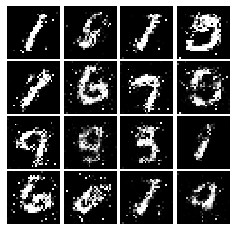

Epoch: 6, Iter: 3160, D: 1.29, G:0.8004


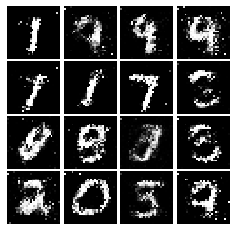

Epoch: 6, Iter: 3180, D: 1.315, G:0.7486


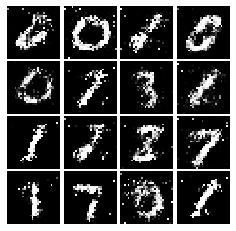

Epoch: 6, Iter: 3200, D: 1.38, G:0.7787


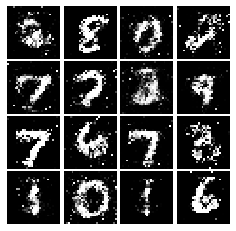

Epoch: 6, Iter: 3220, D: 1.302, G:0.7599


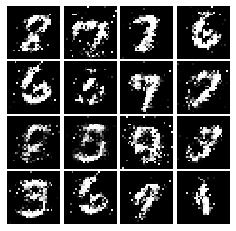

Epoch: 6, Iter: 3240, D: 1.291, G:0.7631


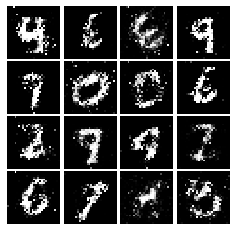

Epoch: 6, Iter: 3260, D: 1.386, G:0.7946


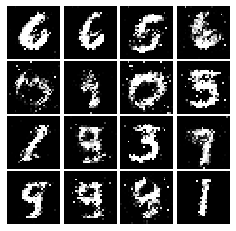

Epoch: 6, Iter: 3280, D: 1.372, G:0.7092


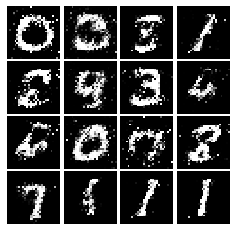

Epoch: 7, Iter: 3300, D: 1.268, G:0.7615


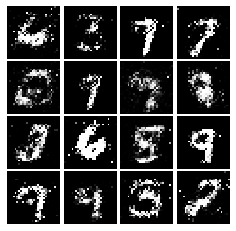

Epoch: 7, Iter: 3320, D: 1.263, G:0.7719


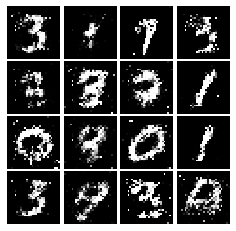

Epoch: 7, Iter: 3340, D: 1.322, G:0.8877


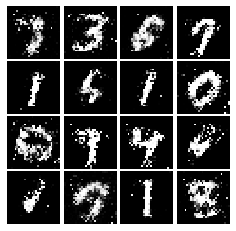

Epoch: 7, Iter: 3360, D: 1.356, G:0.7937


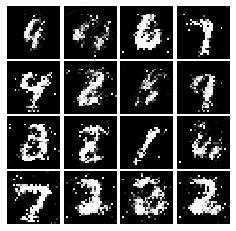

Epoch: 7, Iter: 3380, D: 1.309, G:0.8457


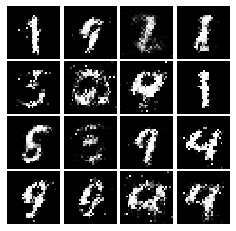

Epoch: 7, Iter: 3400, D: 1.403, G:0.7574


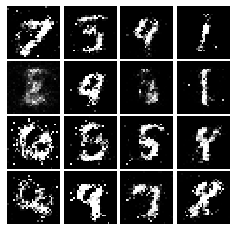

Epoch: 7, Iter: 3420, D: 1.33, G:0.811


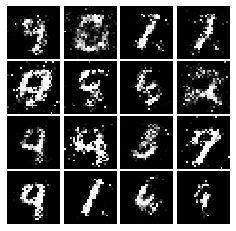

Epoch: 7, Iter: 3440, D: 1.45, G:0.6849


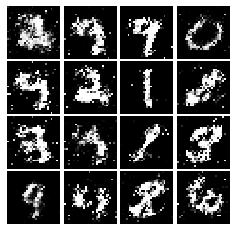

Epoch: 7, Iter: 3460, D: 1.289, G:0.7691


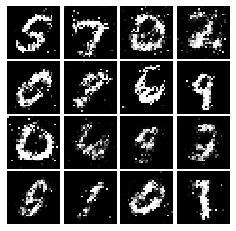

Epoch: 7, Iter: 3480, D: 1.371, G:0.9341


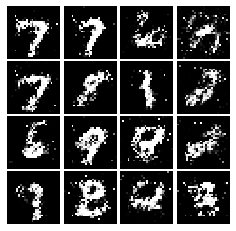

Epoch: 7, Iter: 3500, D: 1.351, G:0.833


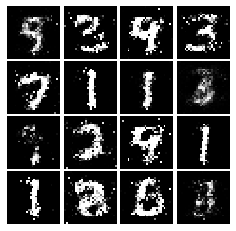

Epoch: 7, Iter: 3520, D: 1.376, G:0.814


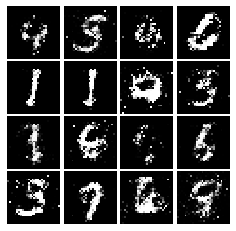

Epoch: 7, Iter: 3540, D: 1.277, G:0.6744


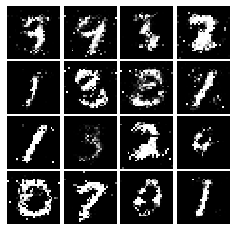

Epoch: 7, Iter: 3560, D: 1.353, G:0.8938


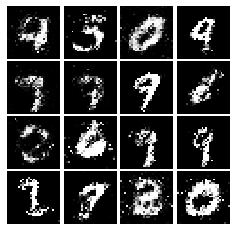

Epoch: 7, Iter: 3580, D: 1.361, G:0.7689


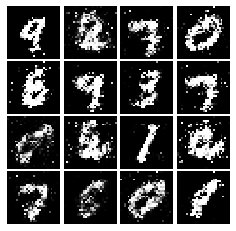

Epoch: 7, Iter: 3600, D: 1.347, G:0.766


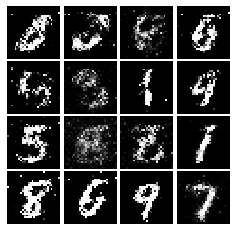

Epoch: 7, Iter: 3620, D: 1.287, G:0.6909


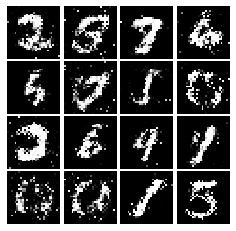

Epoch: 7, Iter: 3640, D: 1.32, G:0.7565


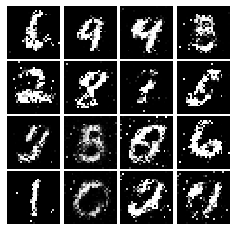

Epoch: 7, Iter: 3660, D: 1.293, G:0.7358


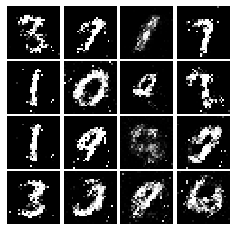

Epoch: 7, Iter: 3680, D: 1.299, G:0.8043


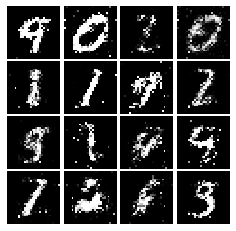

Epoch: 7, Iter: 3700, D: 1.3, G:0.7847


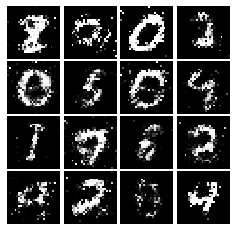

Epoch: 7, Iter: 3720, D: 1.328, G:0.796


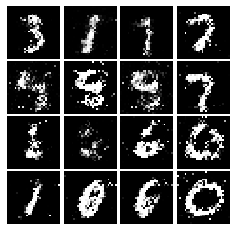

Epoch: 7, Iter: 3740, D: 1.369, G:0.836


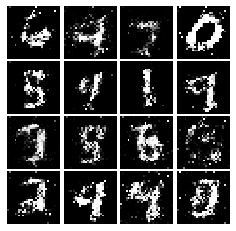

Epoch: 8, Iter: 3760, D: 1.337, G:0.8449


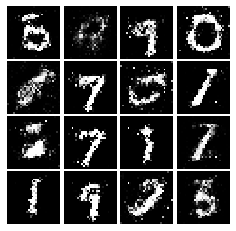

Epoch: 8, Iter: 3780, D: 1.552, G:0.8572


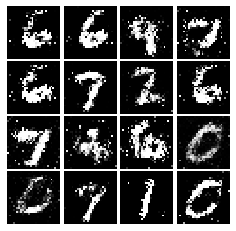

Epoch: 8, Iter: 3800, D: 1.383, G:0.7866


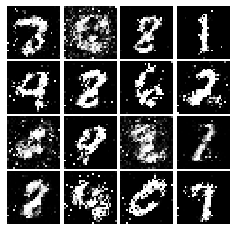

Epoch: 8, Iter: 3820, D: 1.329, G:0.8136


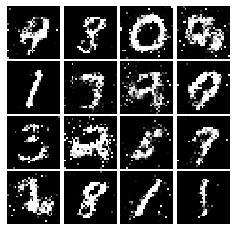

Epoch: 8, Iter: 3840, D: 1.35, G:0.789


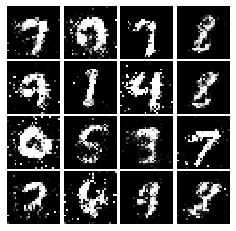

Epoch: 8, Iter: 3860, D: 1.316, G:0.765


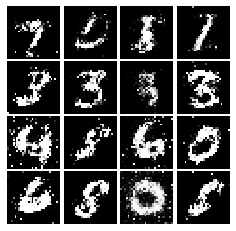

Epoch: 8, Iter: 3880, D: 1.347, G:0.7006


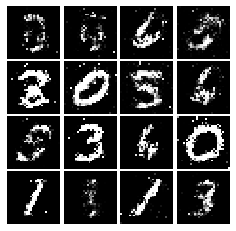

Epoch: 8, Iter: 3900, D: 1.363, G:0.7958


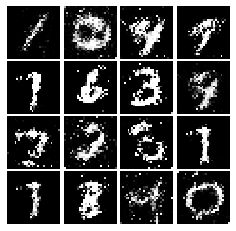

Epoch: 8, Iter: 3920, D: 1.313, G:0.7781


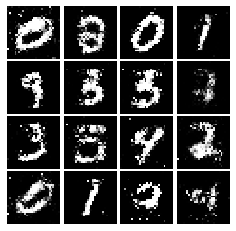

Epoch: 8, Iter: 3940, D: 1.363, G:0.7651


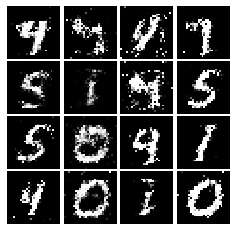

Epoch: 8, Iter: 3960, D: 1.328, G:0.7649


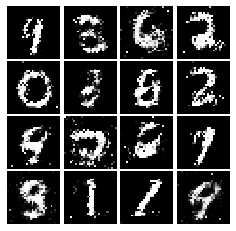

Epoch: 8, Iter: 3980, D: 1.377, G:0.8121


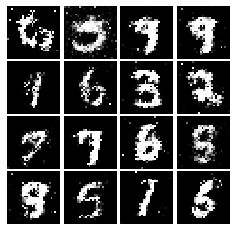

Epoch: 8, Iter: 4000, D: 1.265, G:0.7633


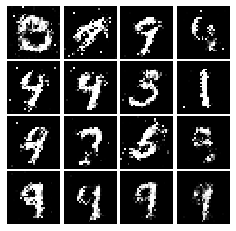

Epoch: 8, Iter: 4020, D: 1.396, G:0.8436


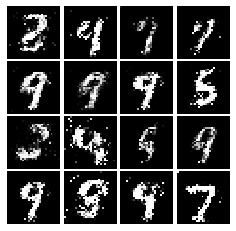

Epoch: 8, Iter: 4040, D: 1.318, G:0.666


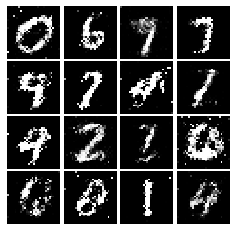

Epoch: 8, Iter: 4060, D: 1.416, G:0.7804


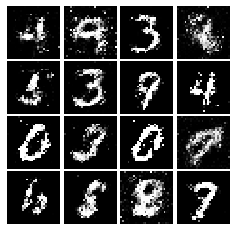

Epoch: 8, Iter: 4080, D: 1.38, G:0.8044


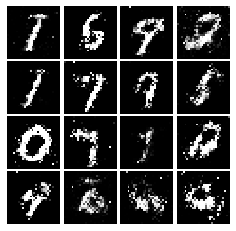

Epoch: 8, Iter: 4100, D: 1.401, G:0.9062


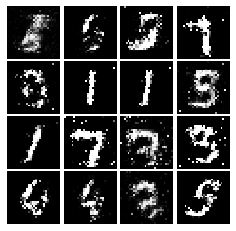

Epoch: 8, Iter: 4120, D: 1.335, G:0.7651


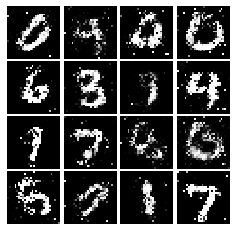

Epoch: 8, Iter: 4140, D: 1.404, G:0.8198


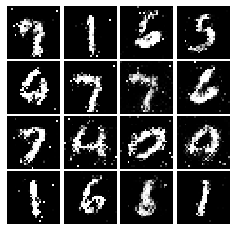

Epoch: 8, Iter: 4160, D: 1.381, G:0.7654


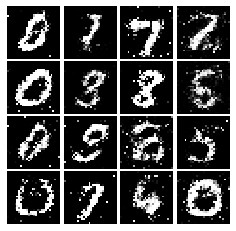

Epoch: 8, Iter: 4180, D: 1.414, G:0.656


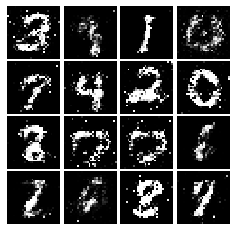

Epoch: 8, Iter: 4200, D: 1.216, G:0.8652


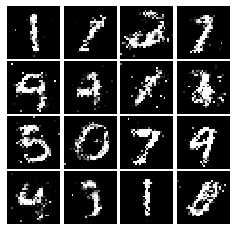

Epoch: 8, Iter: 4220, D: 1.321, G:0.8649


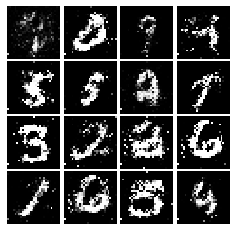

Epoch: 9, Iter: 4240, D: 1.275, G:0.8251


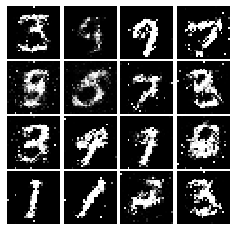

Epoch: 9, Iter: 4260, D: 1.407, G:0.7892


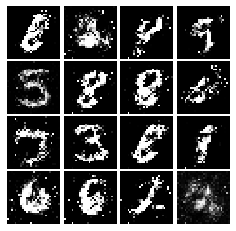

Epoch: 9, Iter: 4280, D: 1.273, G:0.9225


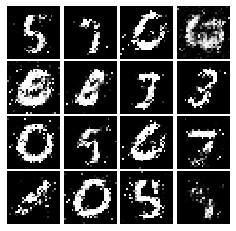

Epoch: 9, Iter: 4300, D: 1.409, G:0.9026


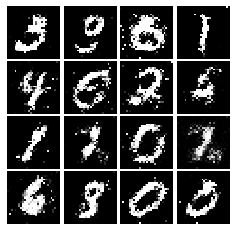

Epoch: 9, Iter: 4320, D: 1.377, G:0.8596


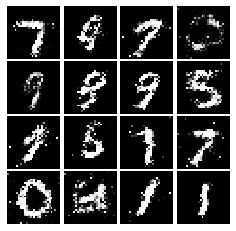

Epoch: 9, Iter: 4340, D: 1.357, G:0.8986


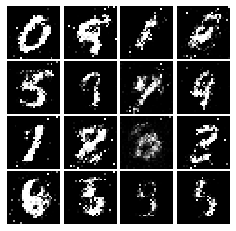

Epoch: 9, Iter: 4360, D: 1.357, G:0.8352


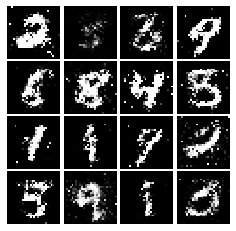

Epoch: 9, Iter: 4380, D: 1.432, G:0.7232


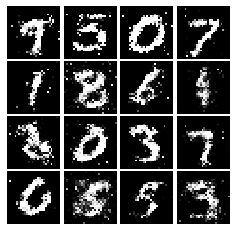

Epoch: 9, Iter: 4400, D: 1.234, G:0.8436


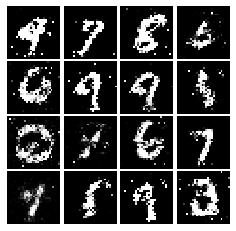

Epoch: 9, Iter: 4420, D: 1.347, G:0.8032


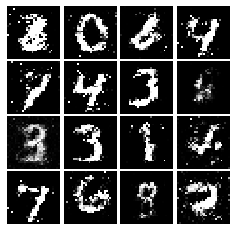

Epoch: 9, Iter: 4440, D: 1.365, G:0.8133


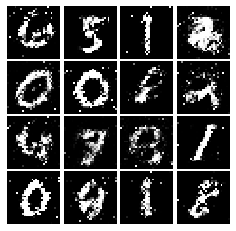

Epoch: 9, Iter: 4460, D: 1.375, G:0.7262


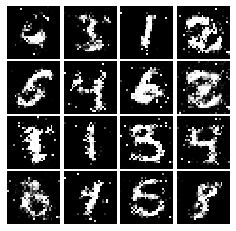

Epoch: 9, Iter: 4480, D: 1.346, G:0.7688


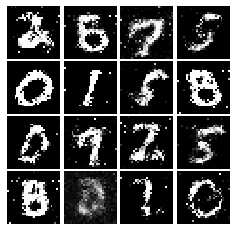

Epoch: 9, Iter: 4500, D: 1.437, G:0.7406


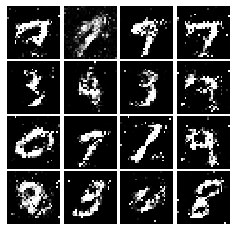

Epoch: 9, Iter: 4520, D: 1.338, G:0.7724


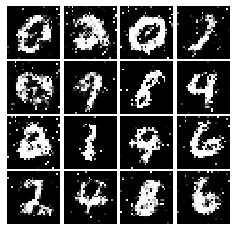

Epoch: 9, Iter: 4540, D: 1.331, G:0.6667


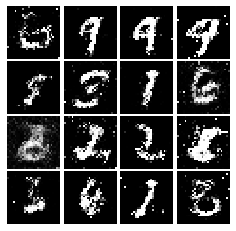

Epoch: 9, Iter: 4560, D: 1.353, G:0.8181


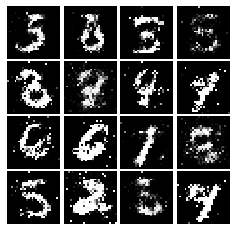

Epoch: 9, Iter: 4580, D: 1.362, G:0.8295


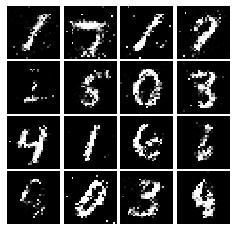

Epoch: 9, Iter: 4600, D: 1.351, G:0.7642


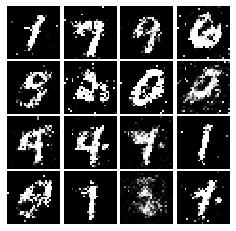

Epoch: 9, Iter: 4620, D: 1.281, G:0.8067


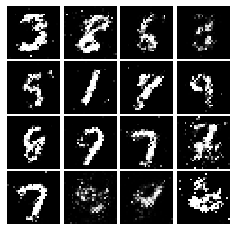

Epoch: 9, Iter: 4640, D: 1.396, G:0.8572


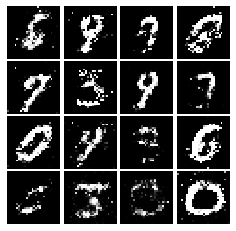

Epoch: 9, Iter: 4660, D: 1.331, G:0.8115


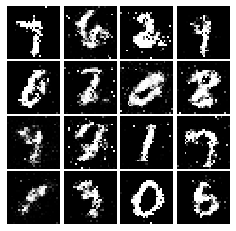

Epoch: 9, Iter: 4680, D: 1.317, G:0.7744


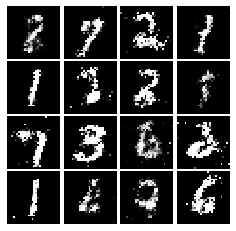

Final images


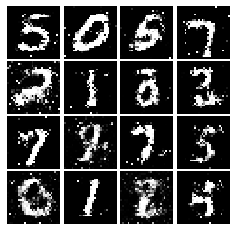

In [21]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [24]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ones = tf.ones(scores_real.shape)
    zeros = tf.zeros(scores_fake.shape)
    
#     bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    
    loss = 0.5 * tf.reduce_mean((scores_real - 1)**2) + 0.5 * tf.reduce_mean((scores_fake)**2)
    

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean((scores_fake - 1)**2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [25]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 1.237, G:0.4217


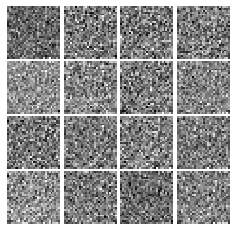

Epoch: 0, Iter: 20, D: 0.03042, G:0.8604


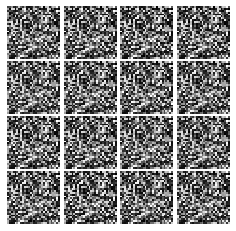

Epoch: 0, Iter: 40, D: 0.04633, G:0.4915


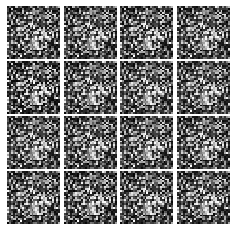

Epoch: 0, Iter: 60, D: 0.01167, G:0.6218


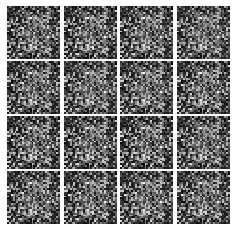

Epoch: 0, Iter: 80, D: 0.114, G:0.2922


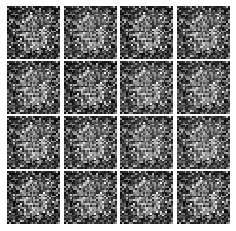

Epoch: 0, Iter: 100, D: 0.3126, G:0.8318


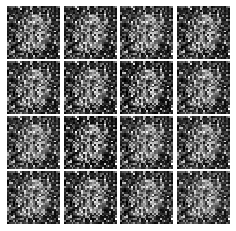

Epoch: 0, Iter: 120, D: 0.1239, G:0.8532


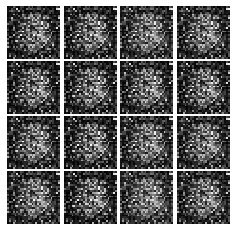

Epoch: 0, Iter: 140, D: 1.218, G:0.2508


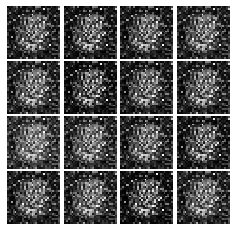

Epoch: 0, Iter: 160, D: 0.2254, G:0.7195


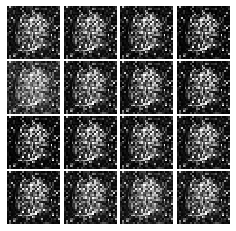

Epoch: 0, Iter: 180, D: 0.1466, G:0.4008


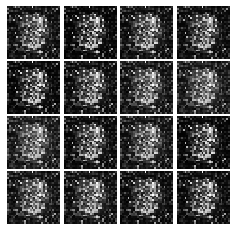

Epoch: 0, Iter: 200, D: 0.3634, G:0.2224


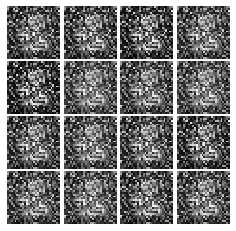

Epoch: 0, Iter: 220, D: 0.5544, G:1.361


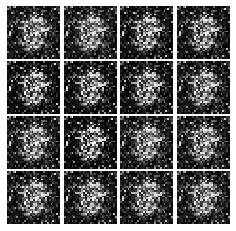

Epoch: 0, Iter: 240, D: 0.2356, G:0.3727


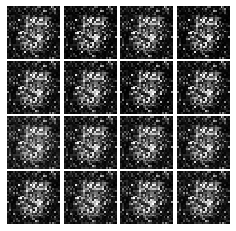

Epoch: 0, Iter: 260, D: 0.1704, G:0.4019


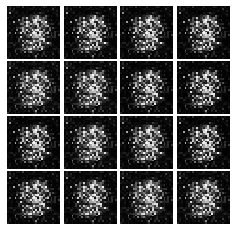

Epoch: 0, Iter: 280, D: 0.2002, G:0.4177


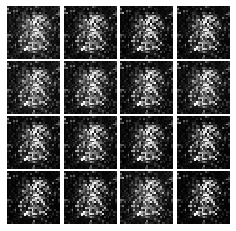

Epoch: 0, Iter: 300, D: 0.1929, G:0.3388


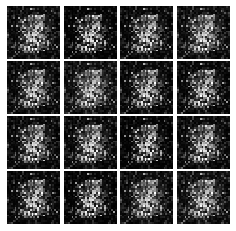

Epoch: 0, Iter: 320, D: 0.2081, G:0.3038


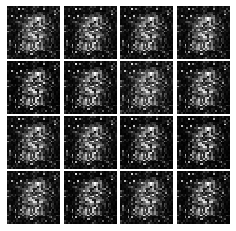

Epoch: 0, Iter: 340, D: 0.1072, G:0.4156


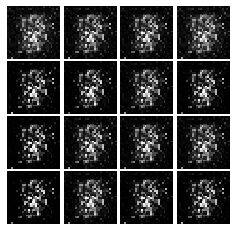

Epoch: 0, Iter: 360, D: 0.1011, G:0.4328


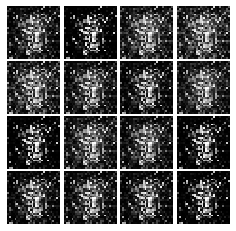

Epoch: 0, Iter: 380, D: 0.1461, G:0.4191


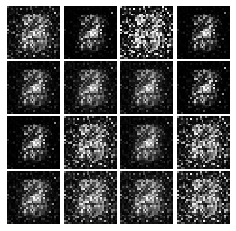

Epoch: 0, Iter: 400, D: 0.7695, G:0.9039


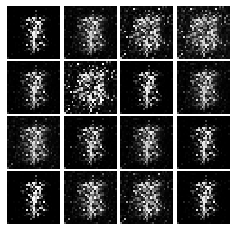

Epoch: 0, Iter: 420, D: 0.159, G:0.3907


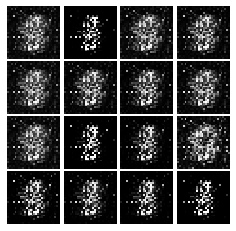

Epoch: 0, Iter: 440, D: 0.09564, G:0.464


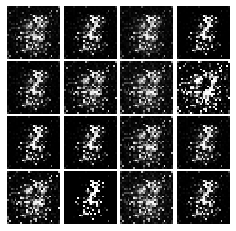

Epoch: 0, Iter: 460, D: 0.0855, G:0.499


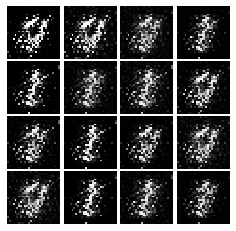

Epoch: 1, Iter: 480, D: 0.1285, G:0.395


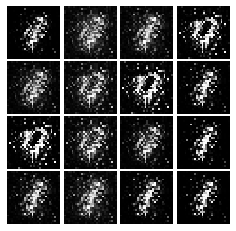

Epoch: 1, Iter: 500, D: 0.1378, G:0.4798


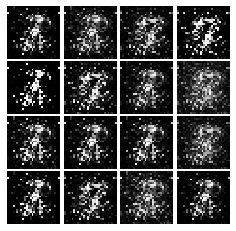

Epoch: 1, Iter: 520, D: 0.1606, G:0.3732


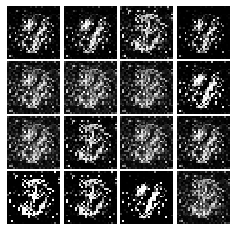

Epoch: 1, Iter: 540, D: 0.1852, G:0.287


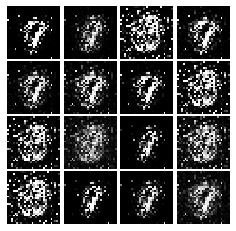

Epoch: 1, Iter: 560, D: 0.1378, G:0.3799


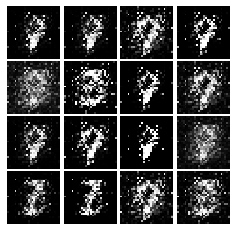

Epoch: 1, Iter: 580, D: 0.1165, G:0.5285


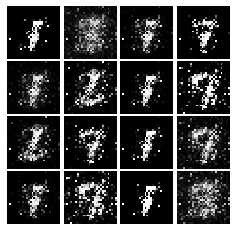

Epoch: 1, Iter: 600, D: 0.1393, G:0.2705


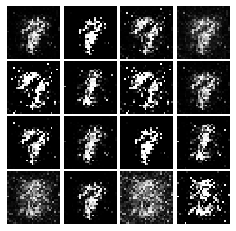

Epoch: 1, Iter: 620, D: 0.1399, G:0.4126


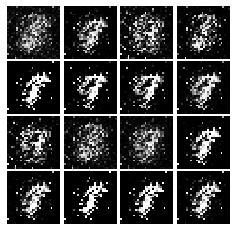

Epoch: 1, Iter: 640, D: 0.232, G:0.2399


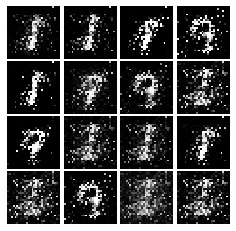

Epoch: 1, Iter: 660, D: 0.1099, G:0.4464


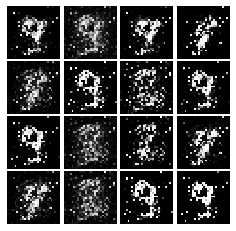

Epoch: 1, Iter: 680, D: 0.3294, G:0.4228


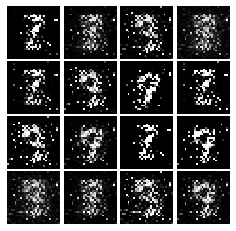

Epoch: 1, Iter: 700, D: 0.1325, G:0.5559


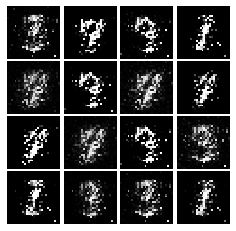

Epoch: 1, Iter: 720, D: 0.1418, G:0.2927


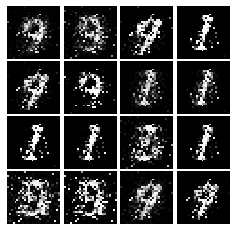

Epoch: 1, Iter: 740, D: 0.1812, G:0.3172


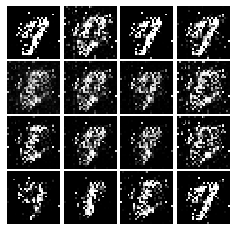

Epoch: 1, Iter: 760, D: 0.8423, G:0.439


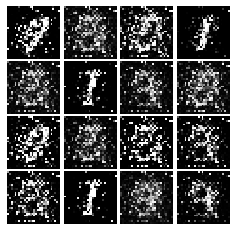

Epoch: 1, Iter: 780, D: 0.1298, G:0.2516


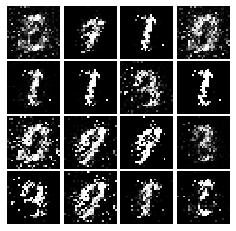

Epoch: 1, Iter: 800, D: 0.09756, G:0.3429


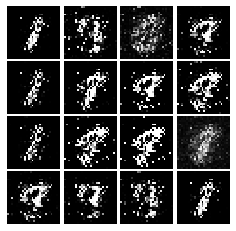

Epoch: 1, Iter: 820, D: 0.1204, G:0.4534


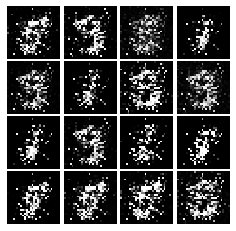

Epoch: 1, Iter: 840, D: 0.1818, G:0.05835


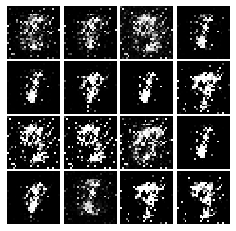

Epoch: 1, Iter: 860, D: 0.4614, G:0.2964


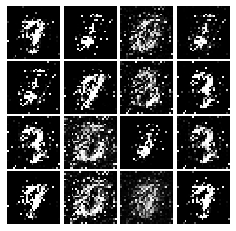

Epoch: 1, Iter: 880, D: 0.1715, G:0.4052


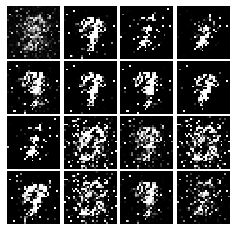

Epoch: 1, Iter: 900, D: 0.1386, G:0.345


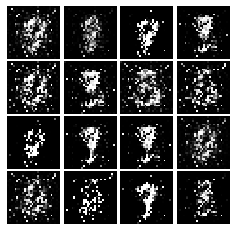

Epoch: 1, Iter: 920, D: 0.1221, G:0.3818


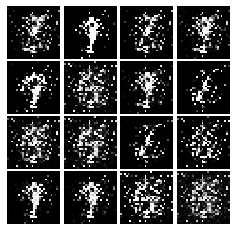

Epoch: 2, Iter: 940, D: 0.09802, G:0.4092


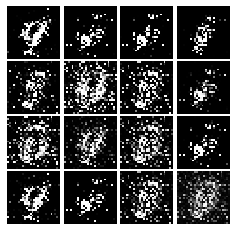

Epoch: 2, Iter: 960, D: 0.1104, G:0.3579


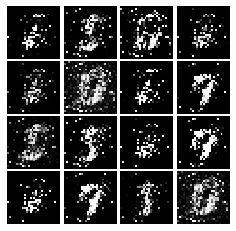

Epoch: 2, Iter: 980, D: 0.08682, G:0.4444


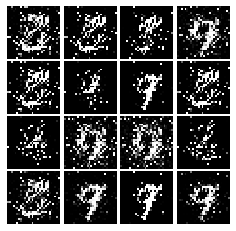

Epoch: 2, Iter: 1000, D: 0.1297, G:0.2688


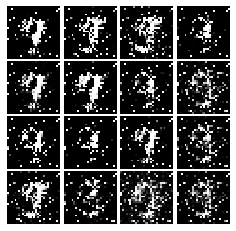

Epoch: 2, Iter: 1020, D: 0.2097, G:0.7102


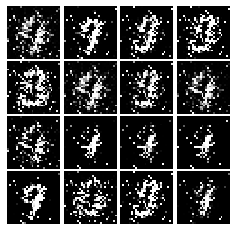

Epoch: 2, Iter: 1040, D: 0.3876, G:0.07417


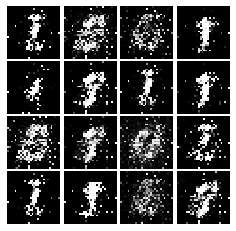

Epoch: 2, Iter: 1060, D: 0.1387, G:0.3327


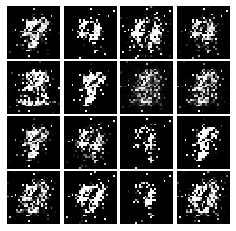

Epoch: 2, Iter: 1080, D: 0.1039, G:0.4837


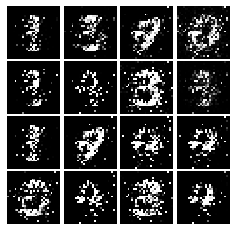

Epoch: 2, Iter: 1100, D: 0.1555, G:0.2789


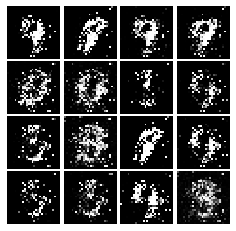

Epoch: 2, Iter: 1120, D: 0.182, G:0.3066


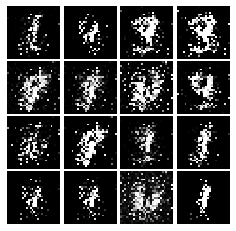

Epoch: 2, Iter: 1140, D: 0.1308, G:0.4576


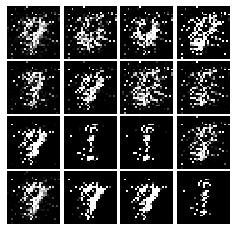

Epoch: 2, Iter: 1160, D: 0.1146, G:0.3114


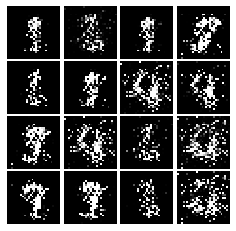

Epoch: 2, Iter: 1180, D: 0.1227, G:0.2764


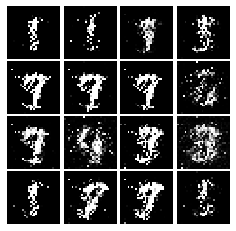

Epoch: 2, Iter: 1200, D: 0.1773, G:0.2705


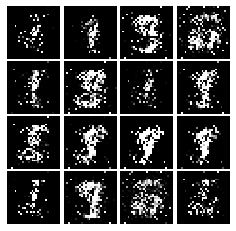

Epoch: 2, Iter: 1220, D: 0.1325, G:0.3661


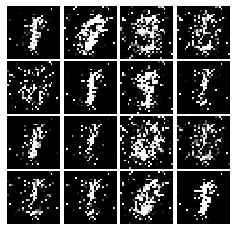

Epoch: 2, Iter: 1240, D: 0.09907, G:0.3177


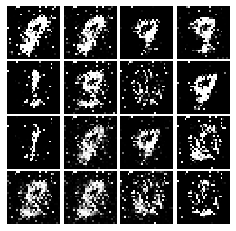

Epoch: 2, Iter: 1260, D: 0.1008, G:0.6077


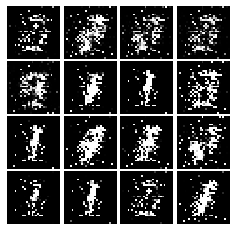

Epoch: 2, Iter: 1280, D: 0.1534, G:0.2509


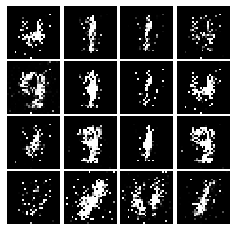

Epoch: 2, Iter: 1300, D: 0.1461, G:0.2796


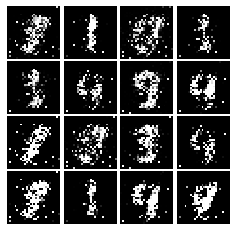

Epoch: 2, Iter: 1320, D: 0.4285, G:0.04805


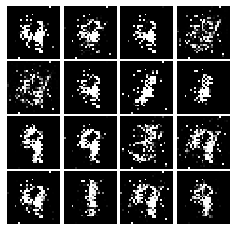

Epoch: 2, Iter: 1340, D: 0.1504, G:0.1673


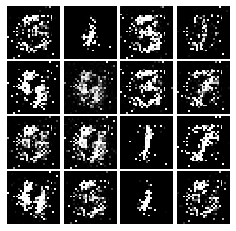

Epoch: 2, Iter: 1360, D: 0.1461, G:0.3294


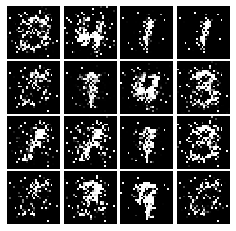

Epoch: 2, Iter: 1380, D: 0.09312, G:0.3768


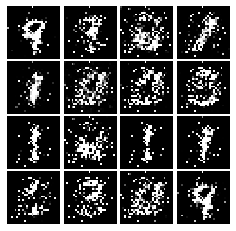

Epoch: 2, Iter: 1400, D: 0.1196, G:0.3234


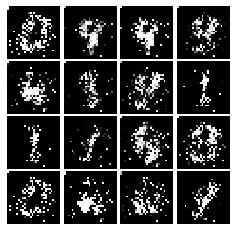

Epoch: 3, Iter: 1420, D: 0.1846, G:0.2107


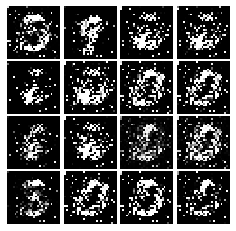

Epoch: 3, Iter: 1440, D: 0.1307, G:0.3242


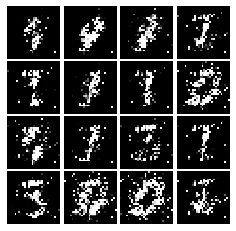

Epoch: 3, Iter: 1460, D: 0.1645, G:0.2776


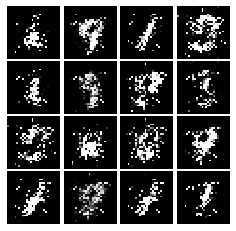

Epoch: 3, Iter: 1480, D: 0.0984, G:0.4166


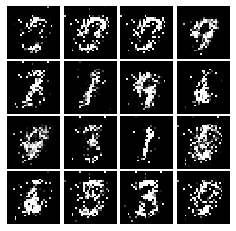

Epoch: 3, Iter: 1500, D: 0.1222, G:0.3046


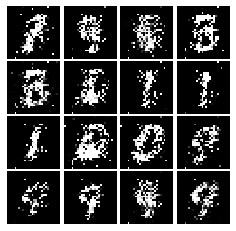

Epoch: 3, Iter: 1520, D: 0.1375, G:0.3237


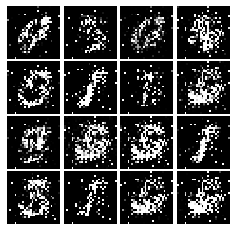

Epoch: 3, Iter: 1540, D: 0.1562, G:0.3441


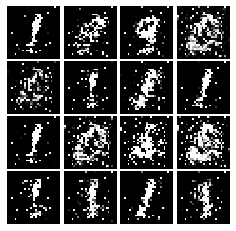

Epoch: 3, Iter: 1560, D: 0.1112, G:0.4602


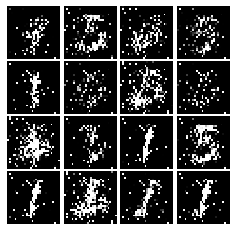

Epoch: 3, Iter: 1580, D: 0.1547, G:0.2854


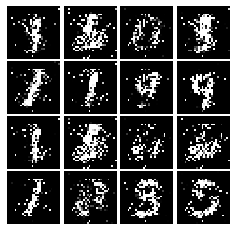

Epoch: 3, Iter: 1600, D: 0.1352, G:0.3222


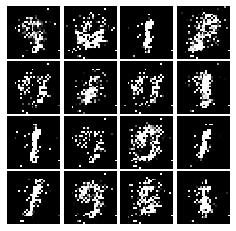

Epoch: 3, Iter: 1620, D: 0.1185, G:0.3499


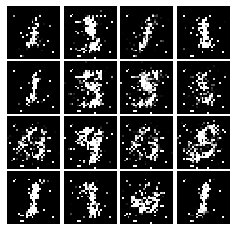

Epoch: 3, Iter: 1640, D: 0.1886, G:0.2384


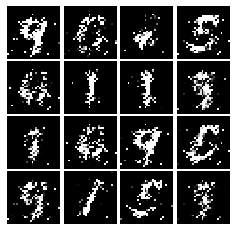

Epoch: 3, Iter: 1660, D: 0.1581, G:0.2991


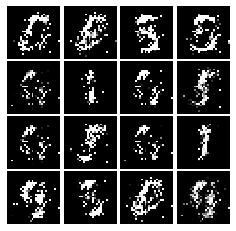

Epoch: 3, Iter: 1680, D: 0.1366, G:0.2846


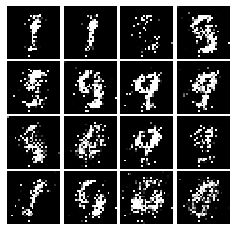

Epoch: 3, Iter: 1700, D: 0.1396, G:0.3289


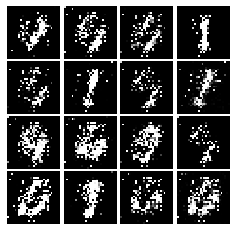

Epoch: 3, Iter: 1720, D: 0.171, G:0.2607


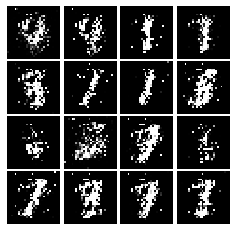

Epoch: 3, Iter: 1740, D: 0.1685, G:0.2895


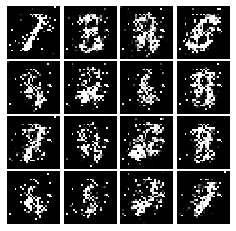

Epoch: 3, Iter: 1760, D: 0.1331, G:0.343


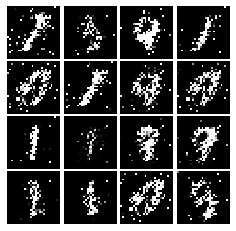

Epoch: 3, Iter: 1780, D: 0.125, G:0.2965


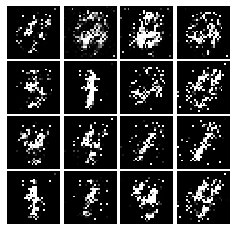

Epoch: 3, Iter: 1800, D: 0.1348, G:0.3258


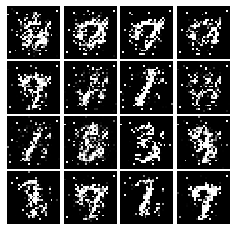

Epoch: 3, Iter: 1820, D: 0.1964, G:0.3933


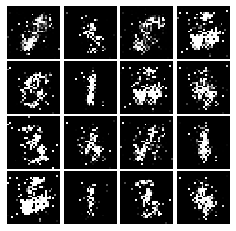

Epoch: 3, Iter: 1840, D: 0.1329, G:0.3072


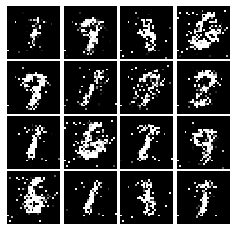

Epoch: 3, Iter: 1860, D: 0.1708, G:0.2155


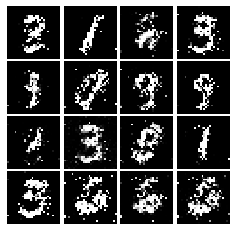

Epoch: 4, Iter: 1880, D: 0.1633, G:0.1701


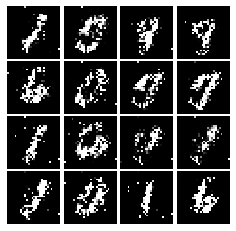

Epoch: 4, Iter: 1900, D: 0.1849, G:0.2099


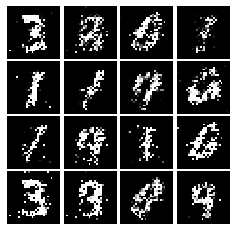

Epoch: 4, Iter: 1920, D: 0.1611, G:0.283


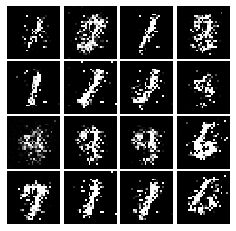

Epoch: 4, Iter: 1940, D: 0.1501, G:0.369


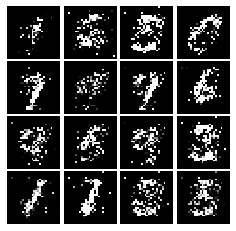

Epoch: 4, Iter: 1960, D: 0.1678, G:0.07516


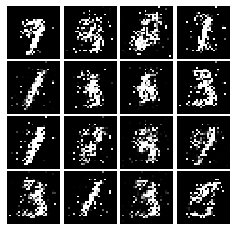

Epoch: 4, Iter: 1980, D: 0.1763, G:0.236


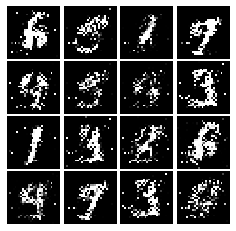

Epoch: 4, Iter: 2000, D: 0.199, G:0.2099


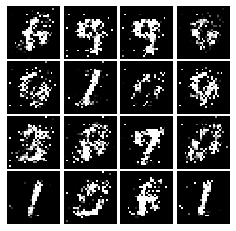

Epoch: 4, Iter: 2020, D: 0.1795, G:0.2141


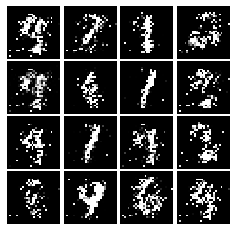

Epoch: 4, Iter: 2040, D: 0.1882, G:0.1517


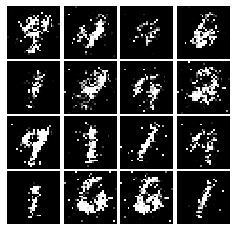

Epoch: 4, Iter: 2060, D: 0.3342, G:0.2577


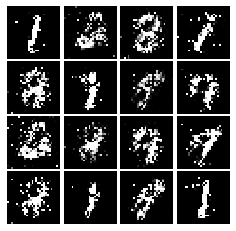

Epoch: 4, Iter: 2080, D: 0.1902, G:0.2348


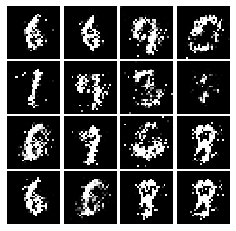

Epoch: 4, Iter: 2100, D: 0.1611, G:0.2174


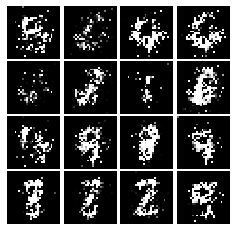

Epoch: 4, Iter: 2120, D: 0.1759, G:0.2412


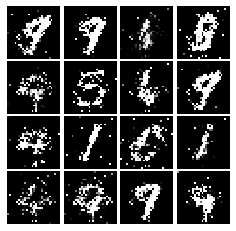

Epoch: 4, Iter: 2140, D: 0.1481, G:0.2673


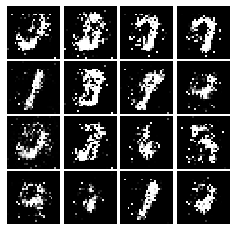

Epoch: 4, Iter: 2160, D: 0.1625, G:0.2169


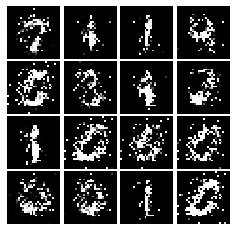

Epoch: 4, Iter: 2180, D: 0.1784, G:0.2466


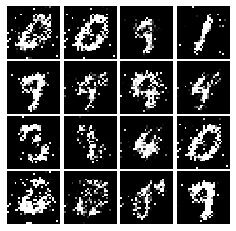

Epoch: 4, Iter: 2200, D: 0.1778, G:0.2461


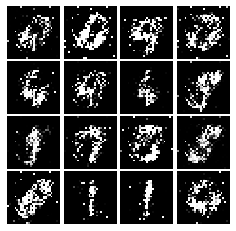

Epoch: 4, Iter: 2220, D: 0.1905, G:0.2459


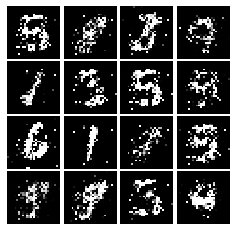

Epoch: 4, Iter: 2240, D: 0.1692, G:0.2852


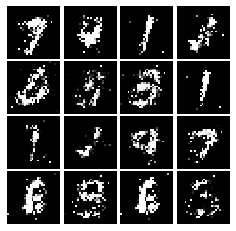

Epoch: 4, Iter: 2260, D: 0.1479, G:0.281


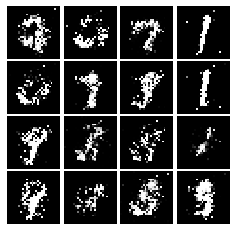

Epoch: 4, Iter: 2280, D: 0.1778, G:0.2807


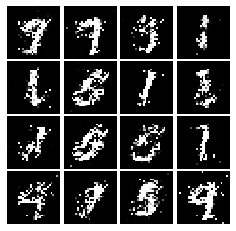

Epoch: 4, Iter: 2300, D: 0.1607, G:0.2206


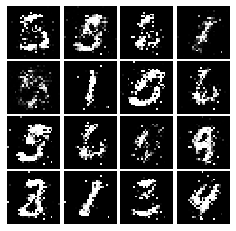

Epoch: 4, Iter: 2320, D: 0.1661, G:0.2421


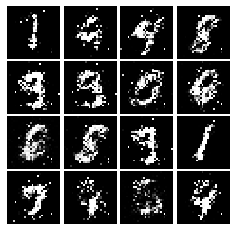

Epoch: 4, Iter: 2340, D: 0.1448, G:0.3106


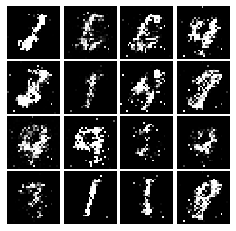

Epoch: 5, Iter: 2360, D: 0.1906, G:0.2189


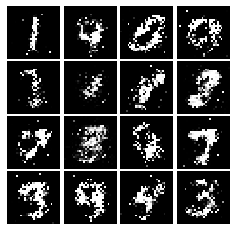

Epoch: 5, Iter: 2380, D: 0.17, G:0.2019


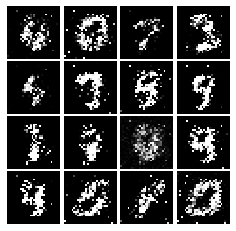

Epoch: 5, Iter: 2400, D: 0.2195, G:0.2619


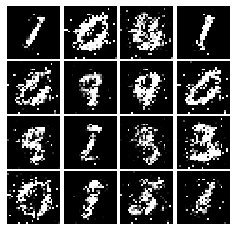

Epoch: 5, Iter: 2420, D: 0.1883, G:0.2374


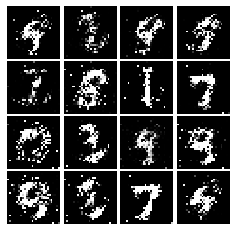

Epoch: 5, Iter: 2440, D: 0.187, G:0.2256


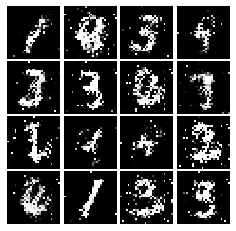

Epoch: 5, Iter: 2460, D: 0.1661, G:0.27


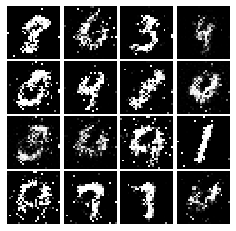

Epoch: 5, Iter: 2480, D: 0.2126, G:0.1847


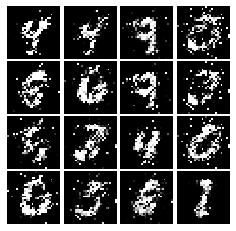

Epoch: 5, Iter: 2500, D: 0.1737, G:0.2335


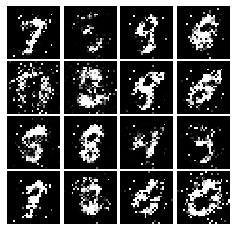

Epoch: 5, Iter: 2520, D: 0.2774, G:0.1935


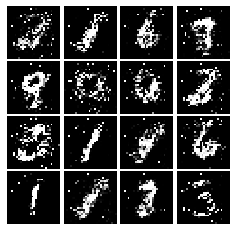

Epoch: 5, Iter: 2540, D: 0.2272, G:0.2344


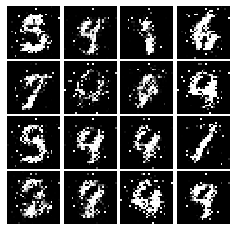

Epoch: 5, Iter: 2560, D: 0.1948, G:0.1946


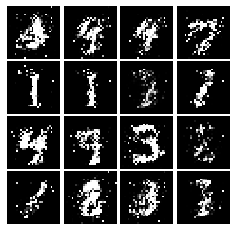

Epoch: 5, Iter: 2580, D: 0.239, G:0.1829


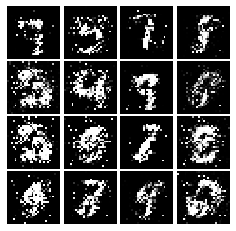

Epoch: 5, Iter: 2600, D: 0.2545, G:0.2148


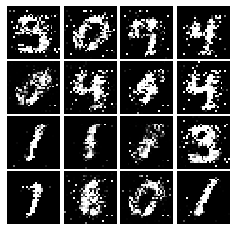

Epoch: 5, Iter: 2620, D: 0.2096, G:0.2113


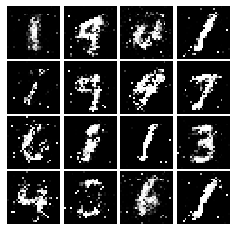

Epoch: 5, Iter: 2640, D: 0.2261, G:0.1895


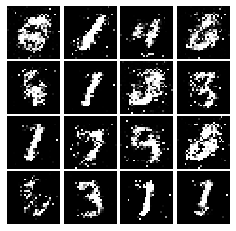

Epoch: 5, Iter: 2660, D: 0.2246, G:0.1665


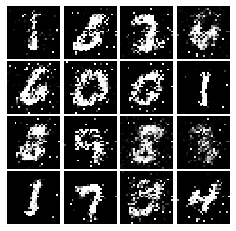

Epoch: 5, Iter: 2680, D: 0.2342, G:0.1814


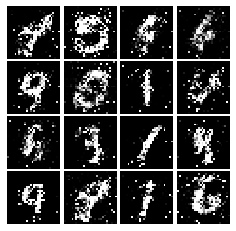

Epoch: 5, Iter: 2700, D: 0.2466, G:0.1715


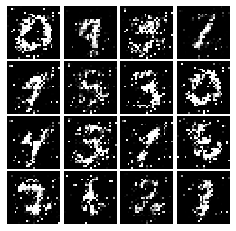

Epoch: 5, Iter: 2720, D: 0.2355, G:0.1835


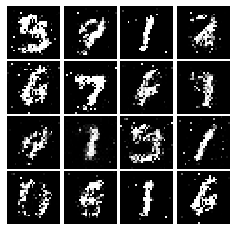

Epoch: 5, Iter: 2740, D: 0.2262, G:0.1745


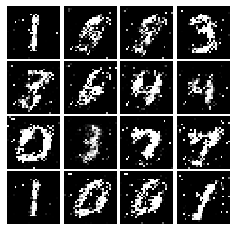

Epoch: 5, Iter: 2760, D: 0.2342, G:0.1768


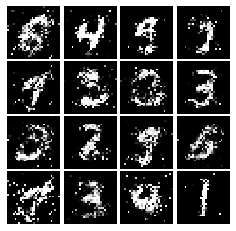

Epoch: 5, Iter: 2780, D: 0.2272, G:0.1775


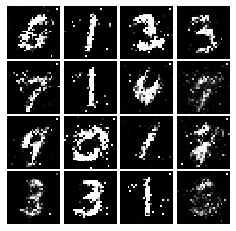

Epoch: 5, Iter: 2800, D: 0.2386, G:0.1956


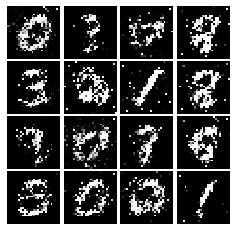

Epoch: 6, Iter: 2820, D: 0.2178, G:0.1546


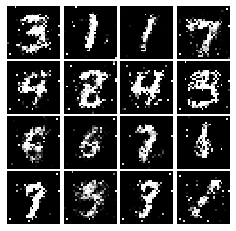

Epoch: 6, Iter: 2840, D: 0.2284, G:0.1709


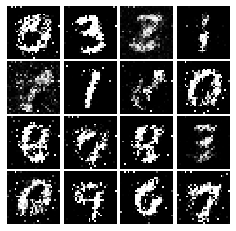

Epoch: 6, Iter: 2860, D: 0.2236, G:0.1799


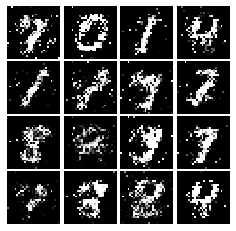

Epoch: 6, Iter: 2880, D: 0.2072, G:0.3124


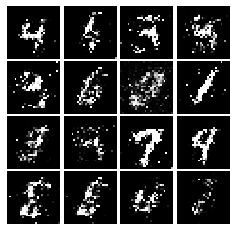

Epoch: 6, Iter: 2900, D: 0.2425, G:0.1759


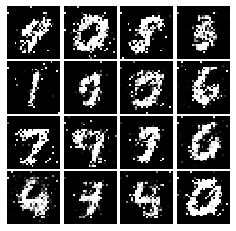

Epoch: 6, Iter: 2920, D: 0.2355, G:0.1788


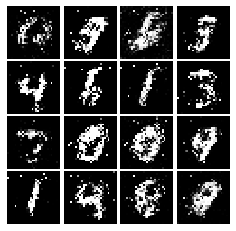

Epoch: 6, Iter: 2940, D: 0.2184, G:0.1669


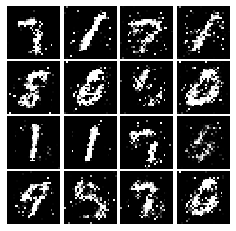

Epoch: 6, Iter: 2960, D: 0.1934, G:0.1867


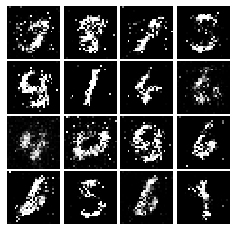

Epoch: 6, Iter: 2980, D: 0.2418, G:0.1249


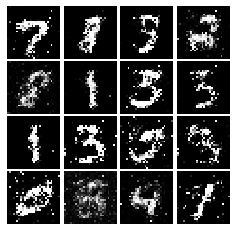

Epoch: 6, Iter: 3000, D: 0.2292, G:0.1487


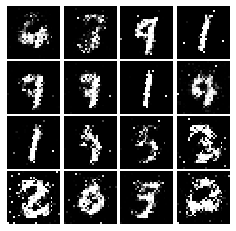

Epoch: 6, Iter: 3020, D: 0.2337, G:0.1521


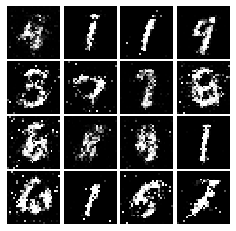

Epoch: 6, Iter: 3040, D: 0.2449, G:0.1459


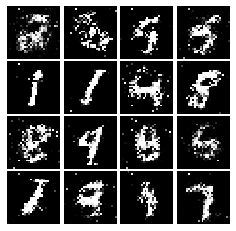

Epoch: 6, Iter: 3060, D: 0.2287, G:0.1828


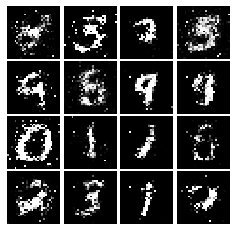

Epoch: 6, Iter: 3080, D: 0.2244, G:0.1758


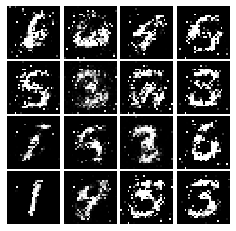

Epoch: 6, Iter: 3100, D: 0.2171, G:0.149


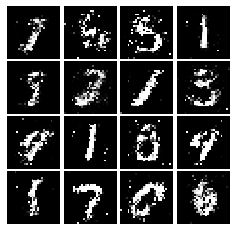

Epoch: 6, Iter: 3120, D: 0.2182, G:0.1573


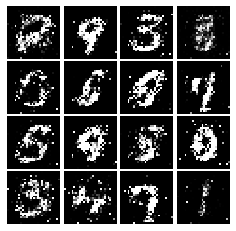

Epoch: 6, Iter: 3140, D: 0.2595, G:0.172


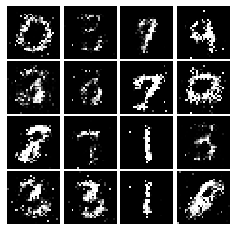

Epoch: 6, Iter: 3160, D: 0.23, G:0.1583


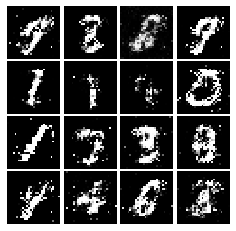

Epoch: 6, Iter: 3180, D: 0.2203, G:0.1603


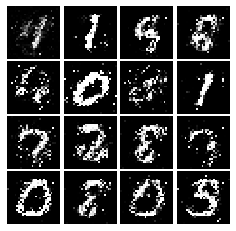

Epoch: 6, Iter: 3200, D: 0.2441, G:0.164


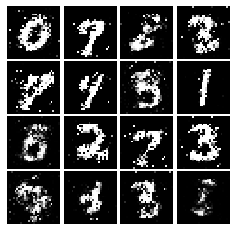

Epoch: 6, Iter: 3220, D: 0.2222, G:0.1796


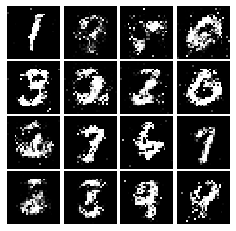

Epoch: 6, Iter: 3240, D: 0.2082, G:0.1639


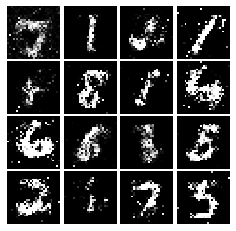

Epoch: 6, Iter: 3260, D: 0.2432, G:0.1524


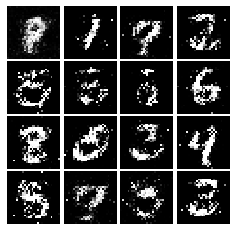

Epoch: 6, Iter: 3280, D: 0.2388, G:0.1416


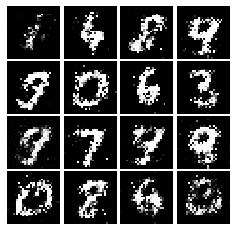

Epoch: 7, Iter: 3300, D: 0.2318, G:0.1694


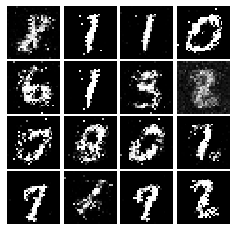

Epoch: 7, Iter: 3320, D: 0.2307, G:0.1705


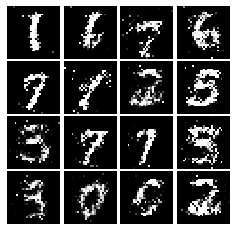

Epoch: 7, Iter: 3340, D: 0.2188, G:0.1731


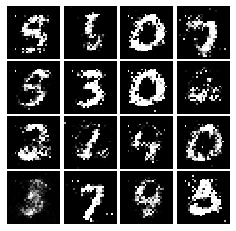

Epoch: 7, Iter: 3360, D: 0.2294, G:0.1724


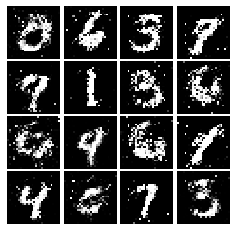

Epoch: 7, Iter: 3380, D: 0.2325, G:0.1737


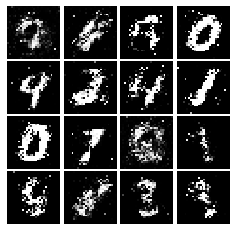

Epoch: 7, Iter: 3400, D: 0.2693, G:0.1364


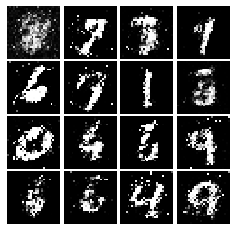

Epoch: 7, Iter: 3420, D: 0.231, G:0.1728


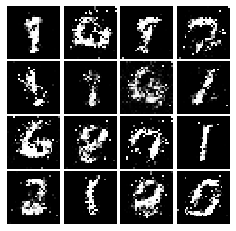

Epoch: 7, Iter: 3440, D: 0.2509, G:0.175


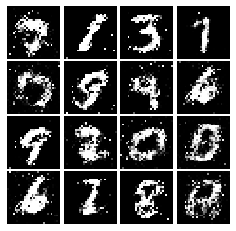

Epoch: 7, Iter: 3460, D: 0.1948, G:0.1729


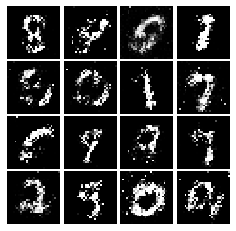

Epoch: 7, Iter: 3480, D: 0.2577, G:0.143


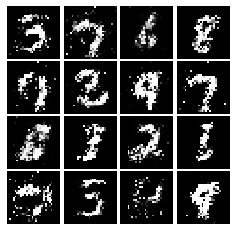

Epoch: 7, Iter: 3500, D: 0.2368, G:0.1702


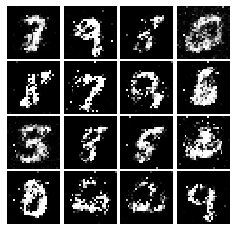

Epoch: 7, Iter: 3520, D: 0.246, G:0.167


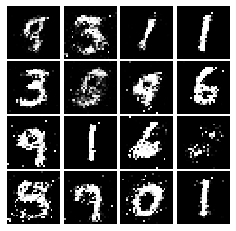

Epoch: 7, Iter: 3540, D: 0.2218, G:0.1553


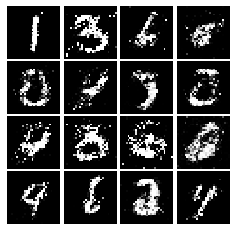

Epoch: 7, Iter: 3560, D: 0.2258, G:0.1804


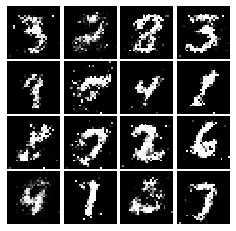

Epoch: 7, Iter: 3580, D: 0.2256, G:0.1529


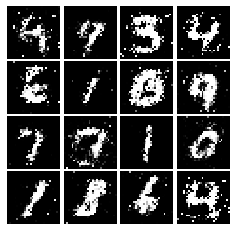

Epoch: 7, Iter: 3600, D: 0.2543, G:0.1647


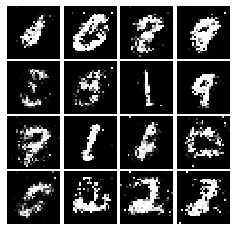

Epoch: 7, Iter: 3620, D: 0.2336, G:0.1686


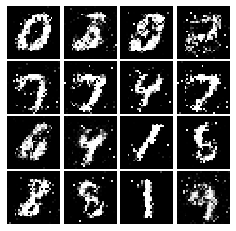

Epoch: 7, Iter: 3640, D: 0.2483, G:0.1796


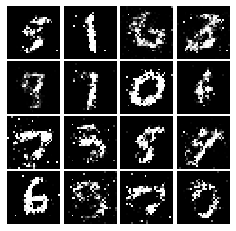

Epoch: 7, Iter: 3660, D: 0.2376, G:0.158


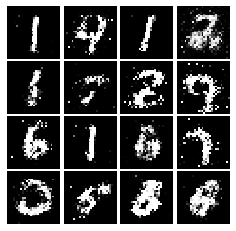

Epoch: 7, Iter: 3680, D: 0.2337, G:0.1559


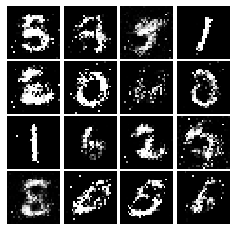

Epoch: 7, Iter: 3700, D: 0.2333, G:0.1588


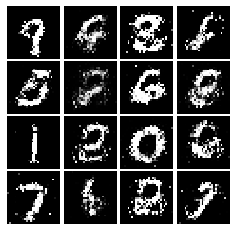

Epoch: 7, Iter: 3720, D: 0.2647, G:0.1639


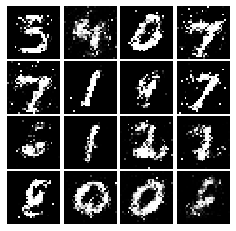

Epoch: 7, Iter: 3740, D: 0.2672, G:0.1375


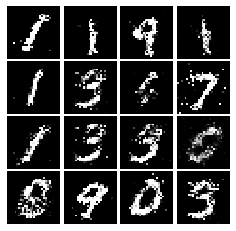

Epoch: 8, Iter: 3760, D: 0.2455, G:0.1972


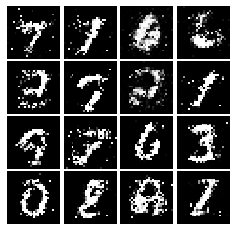

Epoch: 8, Iter: 3780, D: 0.2366, G:0.1447


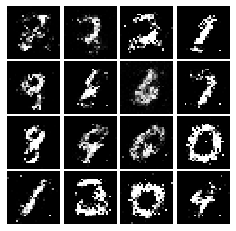

Epoch: 8, Iter: 3800, D: 0.2314, G:0.1661


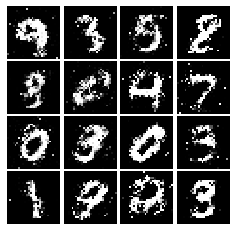

Epoch: 8, Iter: 3820, D: 0.2203, G:0.1697


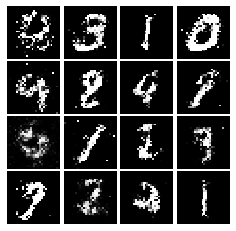

Epoch: 8, Iter: 3840, D: 0.2291, G:0.1545


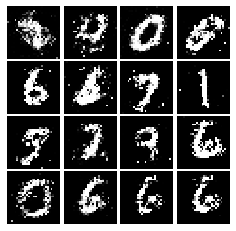

Epoch: 8, Iter: 3860, D: 0.2299, G:0.1455


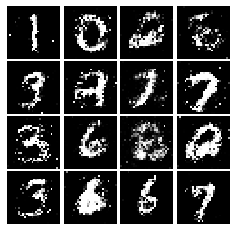

Epoch: 8, Iter: 3880, D: 0.2263, G:0.1288


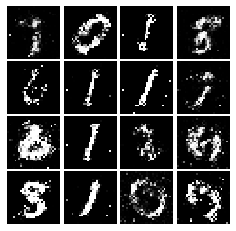

Epoch: 8, Iter: 3900, D: 0.2561, G:0.1653


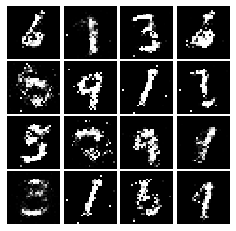

Epoch: 8, Iter: 3920, D: 0.2324, G:0.1697


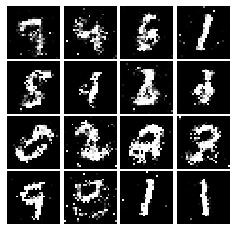

Epoch: 8, Iter: 3940, D: 0.2407, G:0.1548


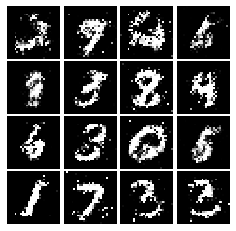

Epoch: 8, Iter: 3960, D: 0.2251, G:0.1577


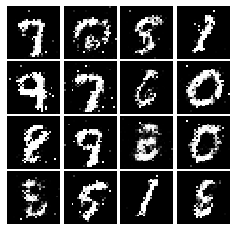

Epoch: 8, Iter: 3980, D: 0.2513, G:0.1753


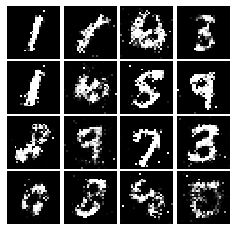

Epoch: 8, Iter: 4000, D: 0.2404, G:0.1655


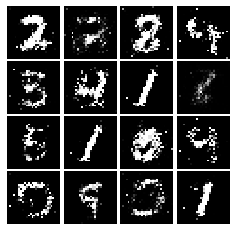

Epoch: 8, Iter: 4020, D: 0.2523, G:0.15


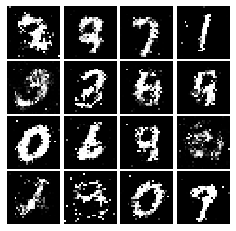

Epoch: 8, Iter: 4040, D: 0.2504, G:0.1845


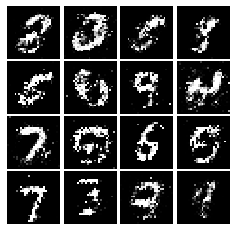

Epoch: 8, Iter: 4060, D: 0.2168, G:0.1524


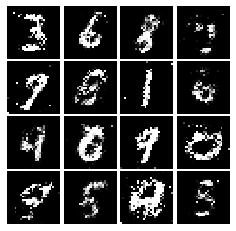

Epoch: 8, Iter: 4080, D: 0.2515, G:0.1603


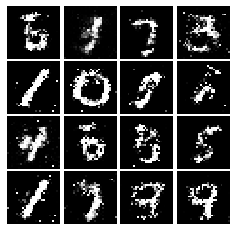

Epoch: 8, Iter: 4100, D: 0.2194, G:0.1344


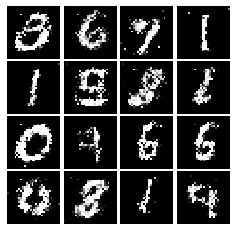

Epoch: 8, Iter: 4120, D: 0.239, G:0.1756


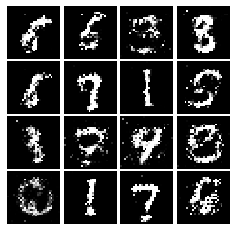

Epoch: 8, Iter: 4140, D: 0.2379, G:0.182


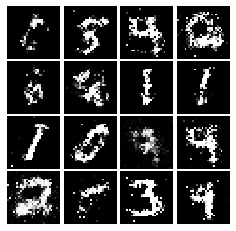

Epoch: 8, Iter: 4160, D: 0.2412, G:0.1678


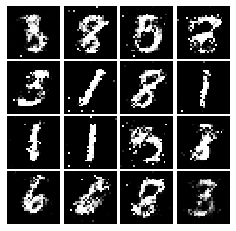

Epoch: 8, Iter: 4180, D: 0.2472, G:0.1485


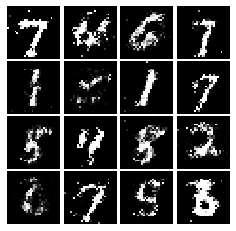

Epoch: 8, Iter: 4200, D: 0.2394, G:0.1453


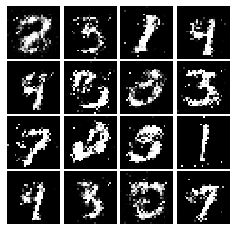

Epoch: 8, Iter: 4220, D: 0.2378, G:0.173


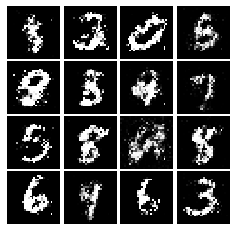

Epoch: 9, Iter: 4240, D: 0.2489, G:0.1749


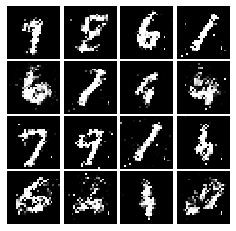

Epoch: 9, Iter: 4260, D: 0.2353, G:0.1403


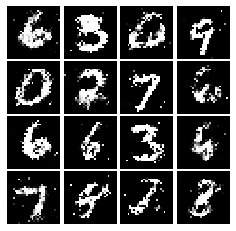

Epoch: 9, Iter: 4280, D: 0.246, G:0.1627


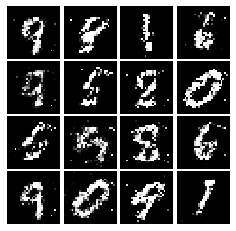

Epoch: 9, Iter: 4300, D: 0.2785, G:0.1442


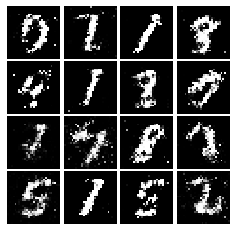

Epoch: 9, Iter: 4320, D: 0.2476, G:0.1567


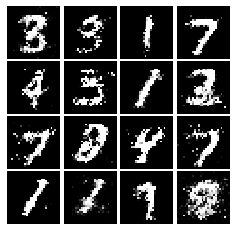

Epoch: 9, Iter: 4340, D: 0.258, G:0.1672


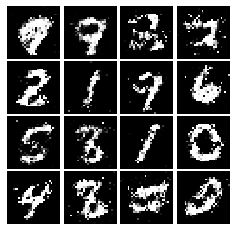

Epoch: 9, Iter: 4360, D: 0.2469, G:0.1619


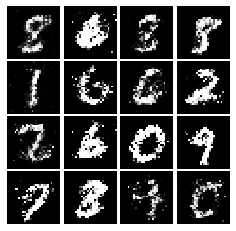

Epoch: 9, Iter: 4380, D: 0.2328, G:0.1733


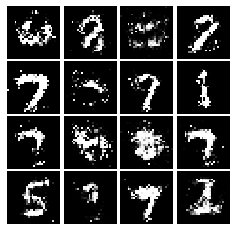

Epoch: 9, Iter: 4400, D: 0.2149, G:0.1562


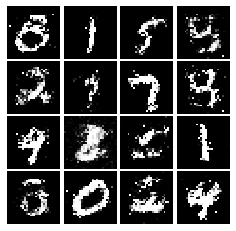

Epoch: 9, Iter: 4420, D: 0.2326, G:0.1505


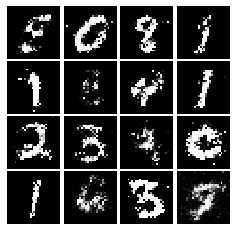

Epoch: 9, Iter: 4440, D: 0.2609, G:0.1427


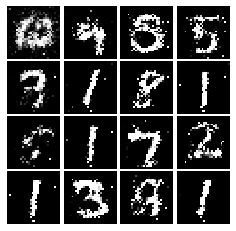

Epoch: 9, Iter: 4460, D: 0.2271, G:0.1591


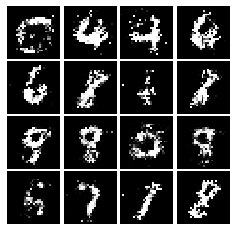

Epoch: 9, Iter: 4480, D: 0.2362, G:0.154


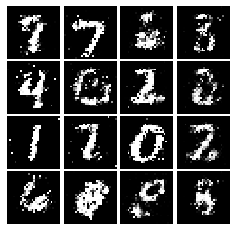

Epoch: 9, Iter: 4500, D: 0.2472, G:0.1636


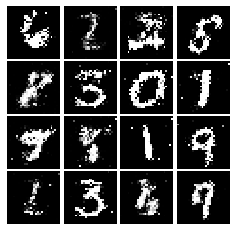

Epoch: 9, Iter: 4520, D: 0.2308, G:0.1656


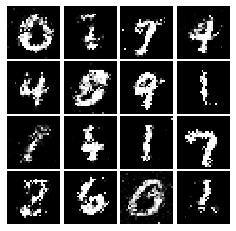

Epoch: 9, Iter: 4540, D: 0.246, G:0.1906


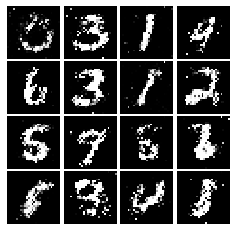

Epoch: 9, Iter: 4560, D: 0.2316, G:0.1688


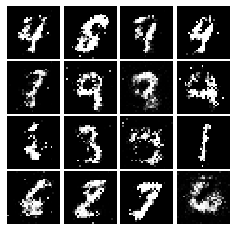

Epoch: 9, Iter: 4580, D: 0.2465, G:0.1321


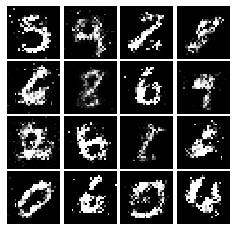

Epoch: 9, Iter: 4600, D: 0.248, G:0.1568


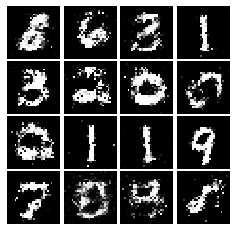

Epoch: 9, Iter: 4620, D: 0.2164, G:0.182


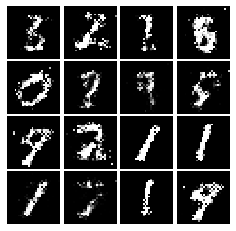

Epoch: 9, Iter: 4640, D: 0.2493, G:0.1478


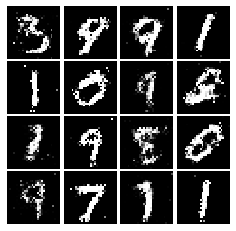

Epoch: 9, Iter: 4660, D: 0.2567, G:0.1585


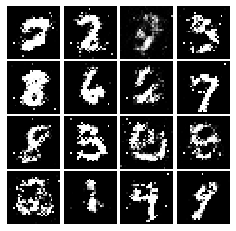

Epoch: 9, Iter: 4680, D: 0.2368, G:0.1738


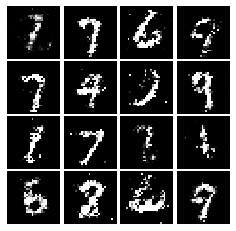

Final images


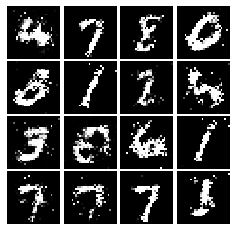

In [26]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [33]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Reshape((28, 28, 1), input_shape=(784,)),
        tf.keras.layers.Conv2D(32, (5, 5), padding='valid', activation=leaky_relu),
        tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=2, padding='valid'),
        tf.keras.layers.Conv2D(64, (5, 5), padding='valid', activation=leaky_relu),
        tf.keras.layers.MaxPool2D(pool_size=(2, 2), strides=2, padding='valid'),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64, activation=leaky_relu),
        tf.keras.layers.Dense(1)
        
        

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [42]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(1024, input_shape=(noise_dim,), activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(7*7*128, activation='relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape((7, 7, 128)),
        tf.keras.layers.Conv2DTranspose(64, (4, 4), strides=2, activation='relu', padding='same'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(1, (4, 4), strides=2, activation='tanh', padding='same'),
    
    ])
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.389, G:0.6505


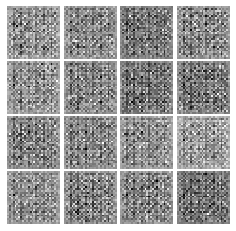

Epoch: 0, Iter: 20, D: 0.4428, G:1.409


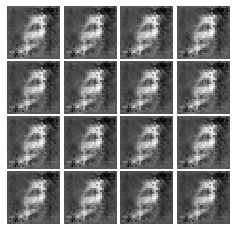

Epoch: 0, Iter: 40, D: 0.05072, G:3.207


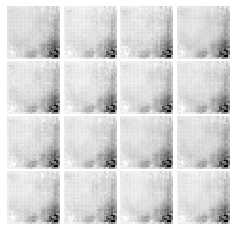

Epoch: 0, Iter: 60, D: 0.00558, G:5.272


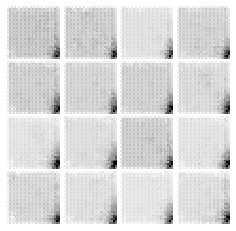

Epoch: 0, Iter: 80, D: 0.002024, G:6.313


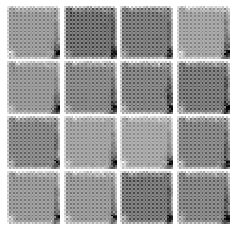

Epoch: 0, Iter: 100, D: 0.001262, G:6.885


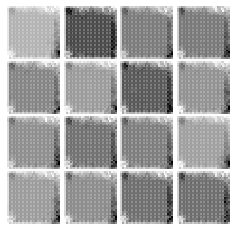

Epoch: 0, Iter: 120, D: 0.0007052, G:7.321


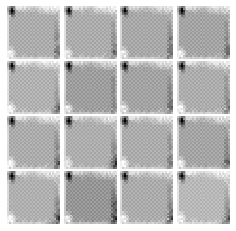

Epoch: 0, Iter: 140, D: 0.0004804, G:7.666


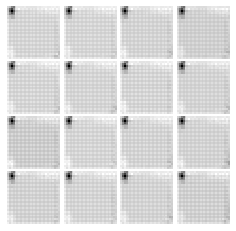

Epoch: 0, Iter: 160, D: 0.0004023, G:8.027


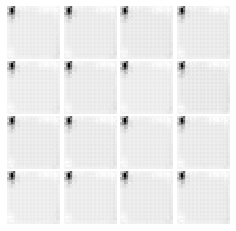

Epoch: 0, Iter: 180, D: 0.001102, G:7.953


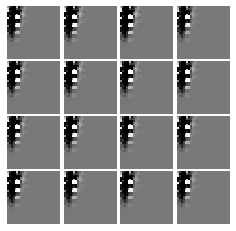

Epoch: 0, Iter: 200, D: 0.1583, G:5.703


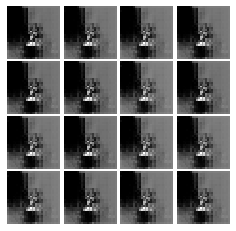

Epoch: 0, Iter: 220, D: 0.7158, G:1.839


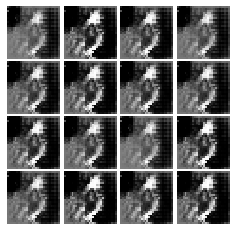

Epoch: 0, Iter: 240, D: 0.2685, G:5.004


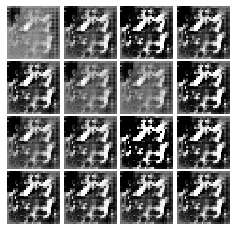

Epoch: 0, Iter: 260, D: 1.492, G:2.605


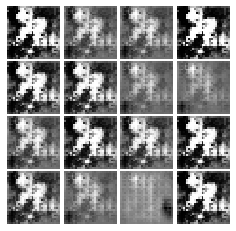

Epoch: 0, Iter: 280, D: 1.023, G:1.645


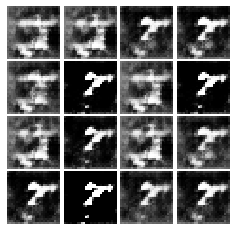

Epoch: 0, Iter: 300, D: 1.016, G:1.276


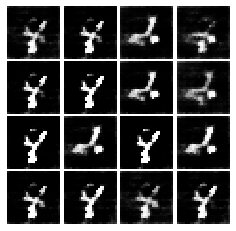

Epoch: 0, Iter: 320, D: 0.4831, G:2.226


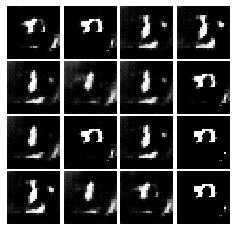

Epoch: 0, Iter: 340, D: 0.4059, G:2.214


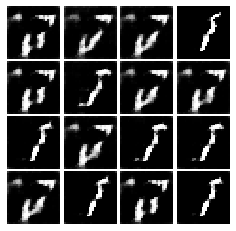

Epoch: 0, Iter: 360, D: 0.5811, G:4.773


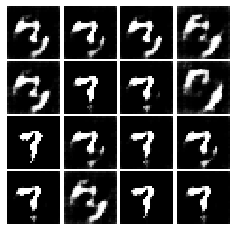

Epoch: 0, Iter: 380, D: 0.4626, G:3.592


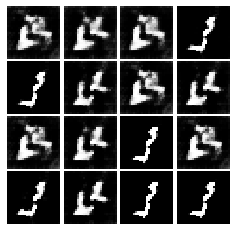

Epoch: 0, Iter: 400, D: 1.115, G:2.371


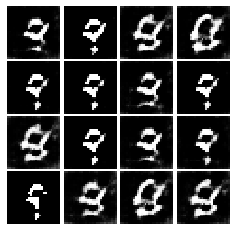

Epoch: 0, Iter: 420, D: 0.4378, G:2.368


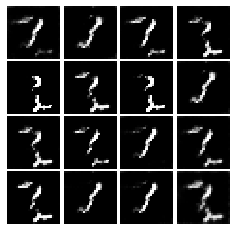

Epoch: 0, Iter: 440, D: 1.683, G:0.9261


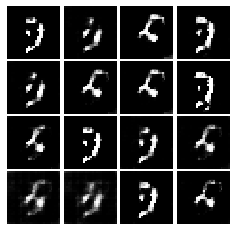

Epoch: 0, Iter: 460, D: 0.9543, G:2.185


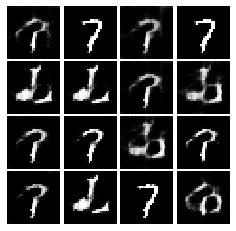

Epoch: 1, Iter: 480, D: 0.5716, G:2.65


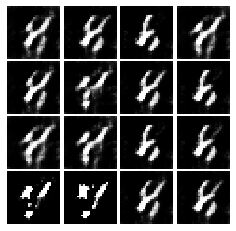

Epoch: 1, Iter: 500, D: 0.3146, G:2.566


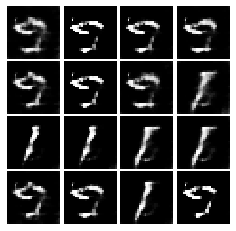

Epoch: 1, Iter: 520, D: 0.2042, G:3.414


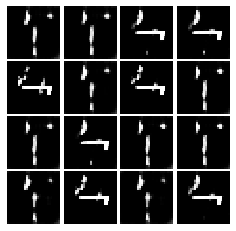

Epoch: 1, Iter: 540, D: 0.6175, G:3.434


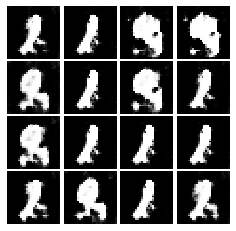

Epoch: 1, Iter: 560, D: 0.5832, G:2.429


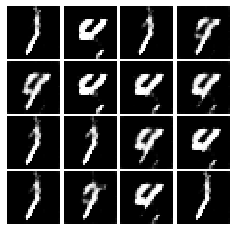

Epoch: 1, Iter: 580, D: 0.82, G:3.61


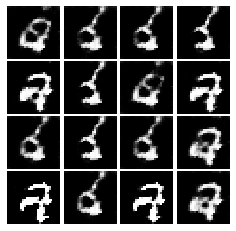

Epoch: 1, Iter: 600, D: 0.7782, G:1.823


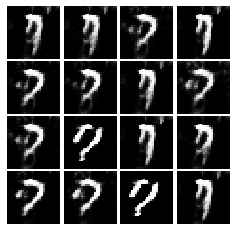

Epoch: 1, Iter: 620, D: 0.4338, G:3.506


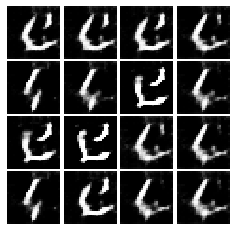

Epoch: 1, Iter: 640, D: 0.3638, G:2.715


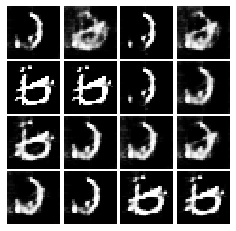

Epoch: 1, Iter: 660, D: 0.836, G:2.478


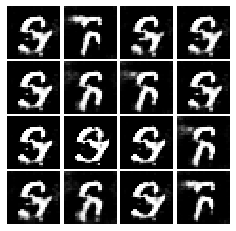

Epoch: 1, Iter: 680, D: 0.4046, G:3.511


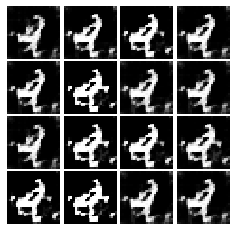

Epoch: 1, Iter: 700, D: 0.4376, G:3.499


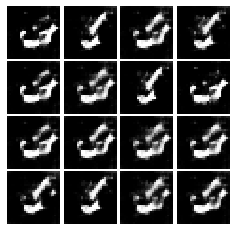

Epoch: 1, Iter: 720, D: 0.2577, G:3.0


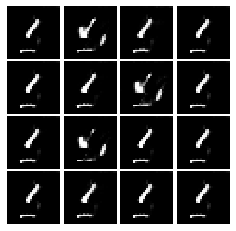

Epoch: 1, Iter: 740, D: 0.5121, G:3.34


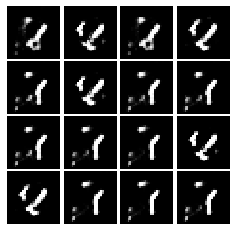

Epoch: 1, Iter: 760, D: 0.495, G:2.51


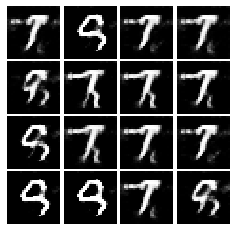

Epoch: 1, Iter: 780, D: 0.4892, G:3.753


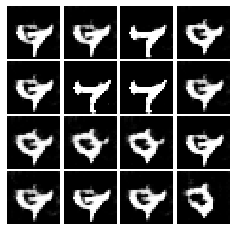

Epoch: 1, Iter: 800, D: 0.187, G:3.961


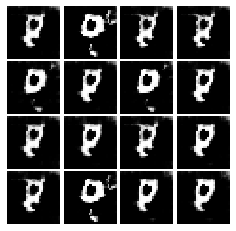

Epoch: 1, Iter: 820, D: 0.2861, G:2.819


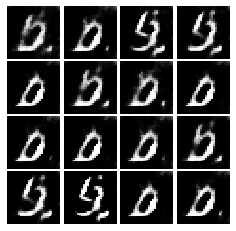

Epoch: 1, Iter: 840, D: 0.4059, G:3.174


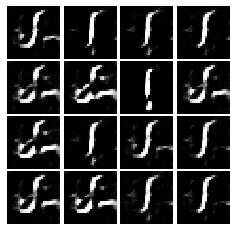

Epoch: 1, Iter: 860, D: 0.3691, G:2.899


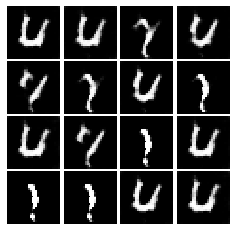

Epoch: 1, Iter: 880, D: 0.3624, G:3.991


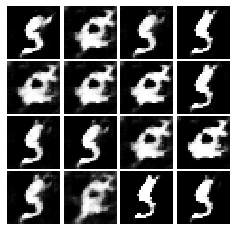

Epoch: 1, Iter: 900, D: 0.2769, G:3.053


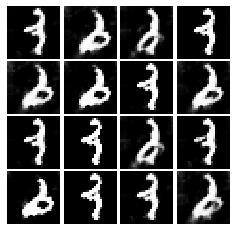

Epoch: 1, Iter: 920, D: 0.4019, G:2.435


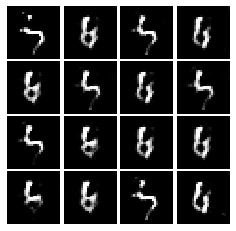

Epoch: 2, Iter: 940, D: 0.2711, G:3.221


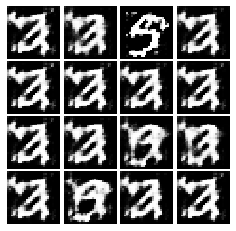

Epoch: 2, Iter: 960, D: 0.8204, G:1.925


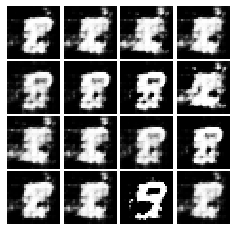

Epoch: 2, Iter: 980, D: 0.1852, G:3.551


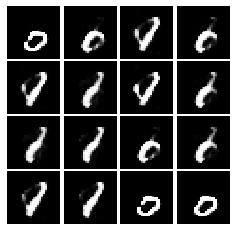

Epoch: 2, Iter: 1000, D: 0.5102, G:2.668


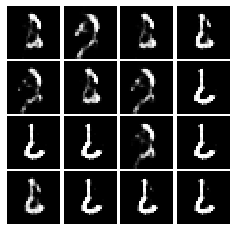

Epoch: 2, Iter: 1020, D: 0.2757, G:3.647


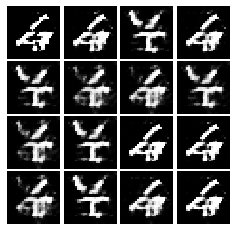

Epoch: 2, Iter: 1040, D: 0.9119, G:2.698


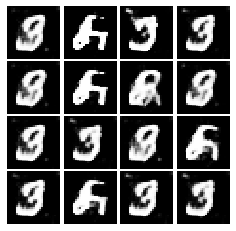

Epoch: 2, Iter: 1060, D: 0.8945, G:4.349


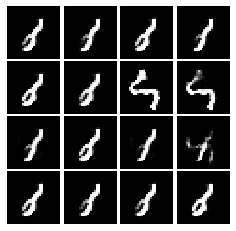

Epoch: 2, Iter: 1080, D: 0.4114, G:3.035


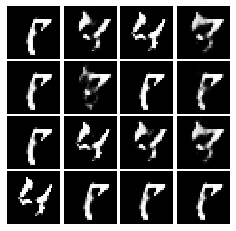

Epoch: 2, Iter: 1100, D: 0.5393, G:3.137


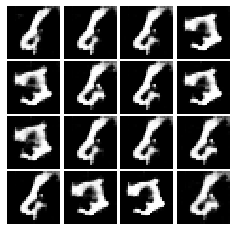

Epoch: 2, Iter: 1120, D: 1.185, G:7.148


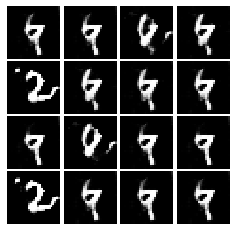

Epoch: 2, Iter: 1140, D: 0.5017, G:4.127


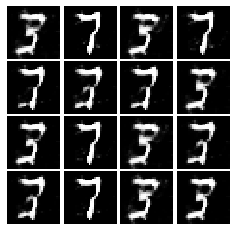

Epoch: 2, Iter: 1160, D: 2.382, G:5.033


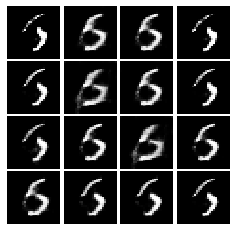

Epoch: 2, Iter: 1180, D: 0.4719, G:3.727


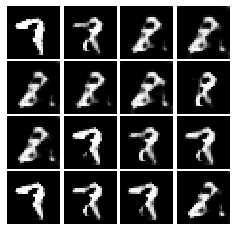

Epoch: 2, Iter: 1200, D: 0.4789, G:2.917


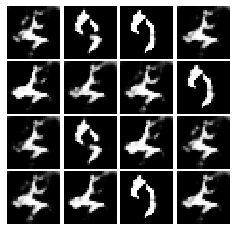

Epoch: 2, Iter: 1220, D: 0.4623, G:2.785


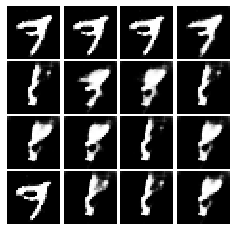

Epoch: 2, Iter: 1240, D: 0.6092, G:4.896


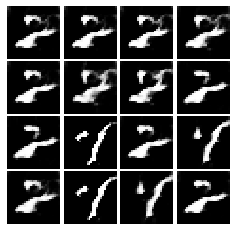

Epoch: 2, Iter: 1260, D: 0.3318, G:3.431


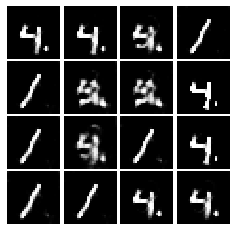

Epoch: 2, Iter: 1280, D: 0.6321, G:4.16


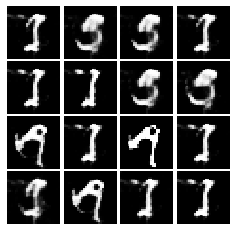

Epoch: 2, Iter: 1300, D: 0.5688, G:3.448


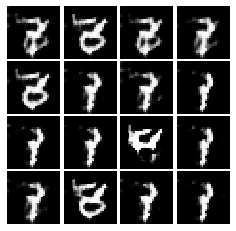

Epoch: 2, Iter: 1320, D: 0.5471, G:5.161


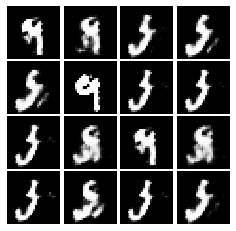

Epoch: 2, Iter: 1340, D: 0.1427, G:5.389


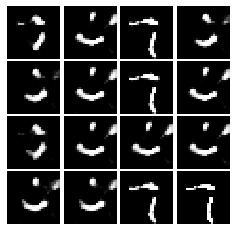

Epoch: 2, Iter: 1360, D: 0.9062, G:1.877


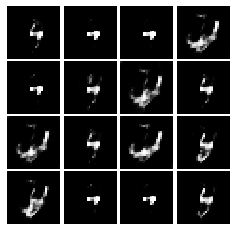

Epoch: 2, Iter: 1380, D: 0.1154, G:3.647


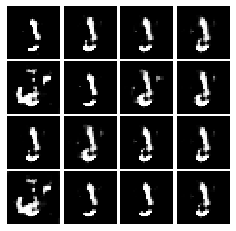

Epoch: 2, Iter: 1400, D: 0.2256, G:2.619


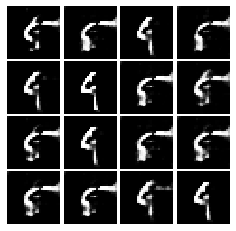

Epoch: 3, Iter: 1420, D: 1.453, G:4.641


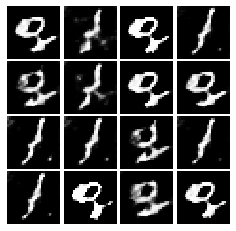

Epoch: 3, Iter: 1440, D: 0.1829, G:3.481


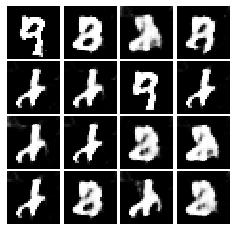

Epoch: 3, Iter: 1460, D: 0.5448, G:3.907


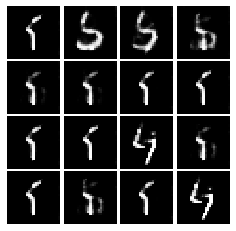

Epoch: 3, Iter: 1480, D: 0.1485, G:4.197


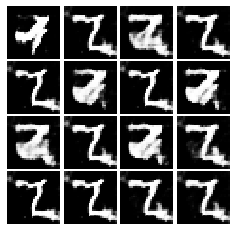

Epoch: 3, Iter: 1500, D: 0.3778, G:2.895


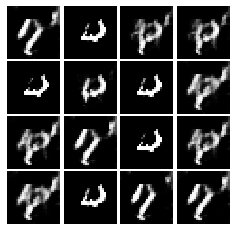

Epoch: 3, Iter: 1520, D: 0.2139, G:3.853


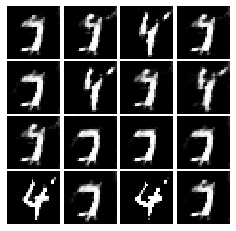

Epoch: 3, Iter: 1540, D: 0.3288, G:3.087


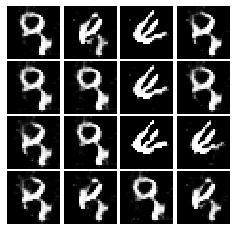

Epoch: 3, Iter: 1560, D: 1.328, G:7.522


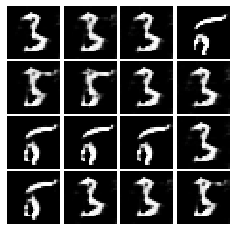

Epoch: 3, Iter: 1580, D: 0.4858, G:4.058


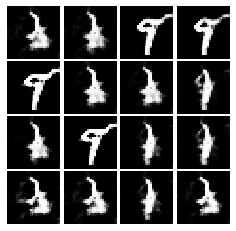

Epoch: 3, Iter: 1600, D: 0.4004, G:3.644


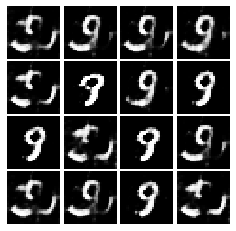

Epoch: 3, Iter: 1620, D: 0.2994, G:4.598


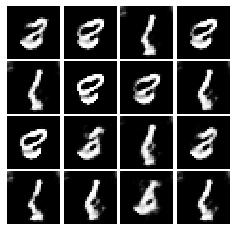

Epoch: 3, Iter: 1640, D: 0.414, G:3.041


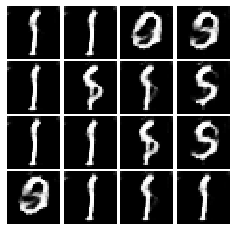

Epoch: 3, Iter: 1660, D: 0.4525, G:3.605


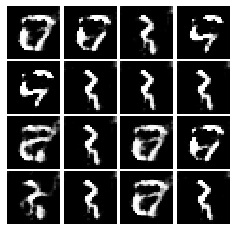

Epoch: 3, Iter: 1680, D: 0.2248, G:3.919


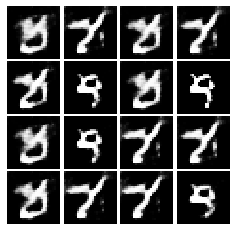

Epoch: 3, Iter: 1700, D: 1.153, G:4.938


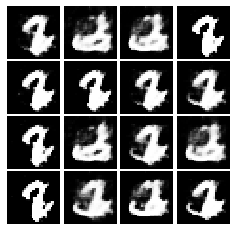

Epoch: 3, Iter: 1720, D: 0.2336, G:3.945


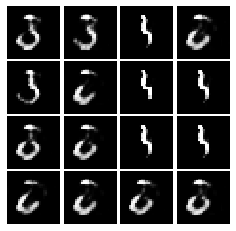

Epoch: 3, Iter: 1740, D: 0.2202, G:3.954


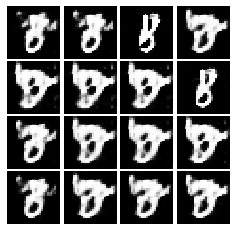

Epoch: 3, Iter: 1760, D: 0.1106, G:3.59


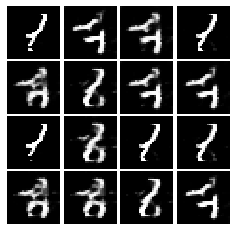

Epoch: 3, Iter: 1780, D: 0.2111, G:4.272


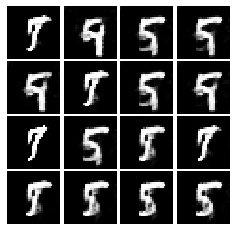

Epoch: 3, Iter: 1800, D: 0.9479, G:2.292


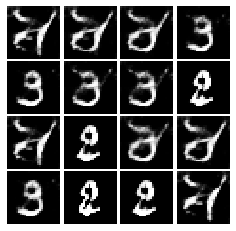

Epoch: 3, Iter: 1820, D: 0.554, G:3.049


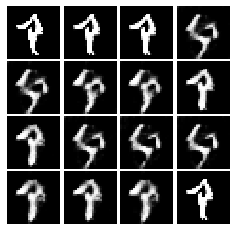

Epoch: 3, Iter: 1840, D: 0.323, G:3.428


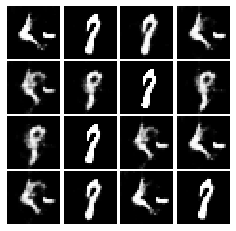

Epoch: 3, Iter: 1860, D: 0.511, G:3.832


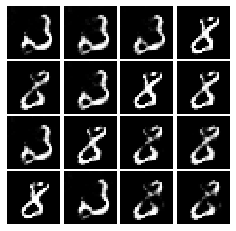

Epoch: 4, Iter: 1880, D: 0.1969, G:3.295


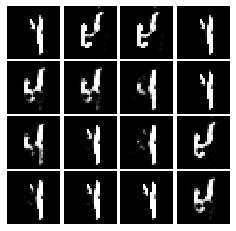

Epoch: 4, Iter: 1900, D: 0.1976, G:3.703


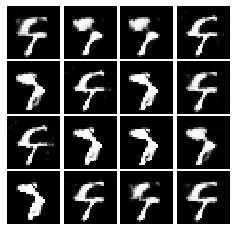

Epoch: 4, Iter: 1920, D: 0.05417, G:4.641


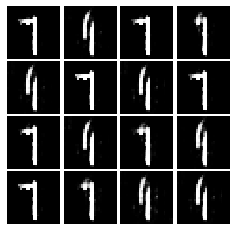

Epoch: 4, Iter: 1940, D: 0.2897, G:2.822


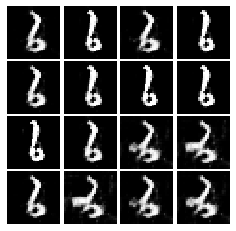

Epoch: 4, Iter: 1960, D: 0.4057, G:3.086


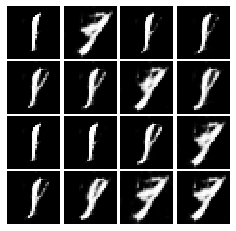

Epoch: 4, Iter: 1980, D: 0.309, G:3.243


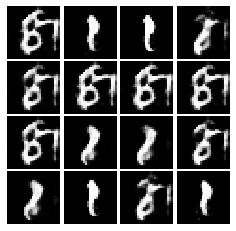

Epoch: 4, Iter: 2000, D: 0.6151, G:3.717


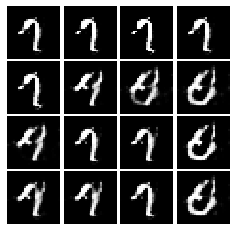

Epoch: 4, Iter: 2020, D: 0.3193, G:3.577


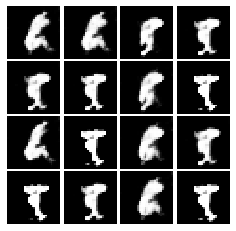

Epoch: 4, Iter: 2040, D: 0.7909, G:5.165


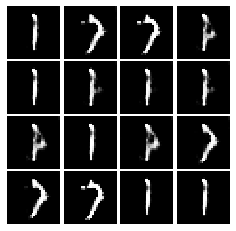

Epoch: 4, Iter: 2060, D: 0.204, G:4.173


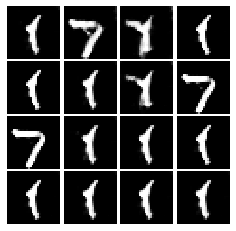

Epoch: 4, Iter: 2080, D: 0.4688, G:3.008


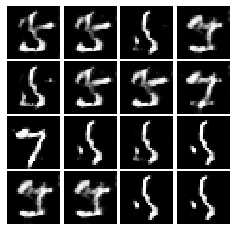

Epoch: 4, Iter: 2100, D: 0.1988, G:3.373


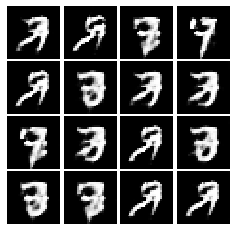

Epoch: 4, Iter: 2120, D: 0.2536, G:3.894


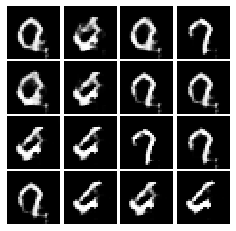

Epoch: 4, Iter: 2140, D: 0.5276, G:3.245


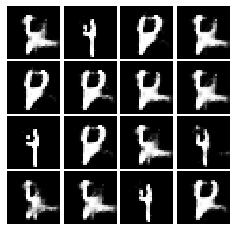

Epoch: 4, Iter: 2160, D: 0.4851, G:3.173


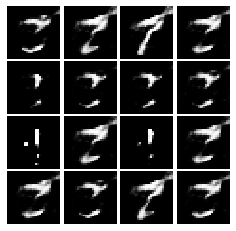

Epoch: 4, Iter: 2180, D: 0.2542, G:3.948


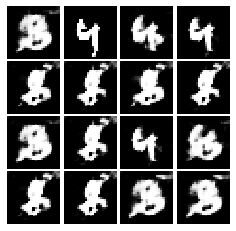

Epoch: 4, Iter: 2200, D: 0.1216, G:4.627


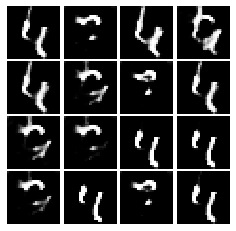

Epoch: 4, Iter: 2220, D: 0.4651, G:5.05


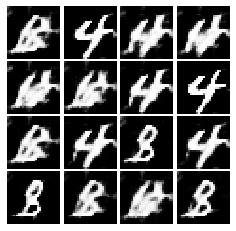

Epoch: 4, Iter: 2240, D: 0.498, G:3.684


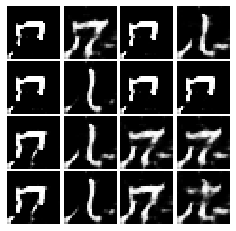

Epoch: 4, Iter: 2260, D: 0.5695, G:3.449


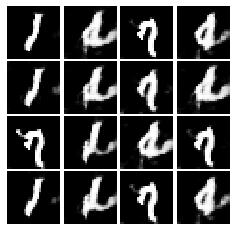

Epoch: 4, Iter: 2280, D: 0.4398, G:2.555


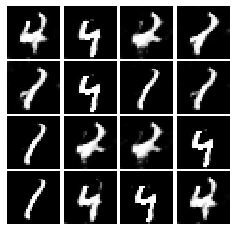

Epoch: 4, Iter: 2300, D: 0.7546, G:3.973


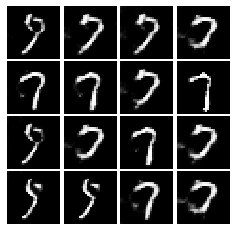

Epoch: 4, Iter: 2320, D: 0.3726, G:3.755


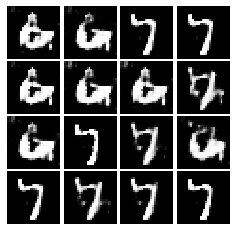

Epoch: 4, Iter: 2340, D: 0.7882, G:2.812


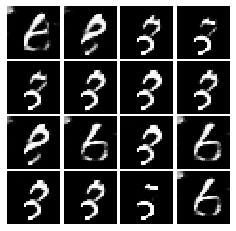

Final images


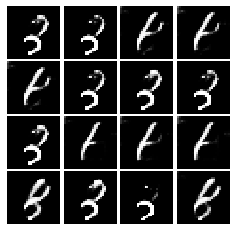

In [43]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2   |   1   |   -1  |  -2   |  -1   |   1    
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |   -1  | -2    |  -1   |  1    |  2    |   1
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer:  
No, because we are in a cyclic graph.


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
No. Discriminator is making unthoughtful guesses that fools the generator into believing it is producing good results (real images), when in fact the generated image is not close to real. It is like the discriminator is a 10 years old manager while the generator is a 25 years old employee, and the employee has some tricks to easily fool the manager into believing good results while not actually doing the work.

Or as other says, it can classify noisy images as real ones. Due to the generator starts with noisy images, these noisy images can be classified as real ones. Therefore, the generator loss decreases even if the generated images are noisy.